# Semi-supervised surgery pipeline with SCANVI

In [1]:
import os
import gdown

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

import torch
import scanpy as sc
import scarches as sca
from scarches.dataset.trvae.data_handling import remove_sparsity

 captum (see https://github.com/pytorch/captum).


In [2]:
torch.cuda.is_available()

True

In [3]:
def plot_training_history(history, keys):
    """
    Plots the training history for the specified keys in a grid layout.
    
    Parameters:
    - history: dict, containing the training history.
    - keys: list of str, the keys to plot from the history.
    """
    num_plots = len(keys)
    grid_size = int(np.ceil(np.sqrt(num_plots)))

    fig, axes = plt.subplots(grid_size, grid_size, figsize=(15, 15))
    axes = axes.flatten()

    for idx, key in enumerate(keys):
        if key in history:
            axes[idx].plot(history[key])
            axes[idx].set_title(key)
        else:
            axes[idx].set_title(f"{key} not found")
        axes[idx].grid(True)

    for idx in range(num_plots, len(axes)):
        fig.delaxes(axes[idx])

    plt.tight_layout()
    plt.show()

In [4]:
sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(dpi=200)
sc.set_figure_params(figsize=(4, 4))
# TODO maybe this is what achieved high accuracy>
torch.set_float32_matmul_precision("high")
torch.set_printoptions(precision=3, sci_mode=False, edgeitems=7)

### IMPORTANT THIS IS WHERE WE CHOOSE THE CELL TYPE LABEL TO TRAIN ON

In [5]:
condition_key = 'dataset'
cell_type_key = 'cell_type_tumor'

## Set relevant anndata.obs labels and training length

These are the filtering criteria we used for only having tumor tissue, and enriched datasets for only one type

In [5]:
# adata = sc.read_h5ad('/root/datos/maestria/netopaas/luca/data/atlas/extended.h5ad')

# adata = adata[(adata.obs.origin == 'tumor_primary')]

# # stages = ['III','III or IV', 'IV']
# stages = ['I','II','III','III or IV', 'IV']
# adata = adata[adata.obs.uicc_stage.isin(stages)]

# # we remove these because some are enriched for endotheliar and some for immune cells
# studies = ['Goveia_Carmeliet_2020','Leader_Merad_2021','Guo_Zhang_2018']
# adata = adata[~adata.obs.study.isin(studies)]

# adata = adata[:, adata.var.is_highly_variable == 'True']

# import gc
# del adata.raw
# gc.collect()

# del adata.layers['counts_length_scaled']
# adata.X = adata.layers['count'].copy()

# adata

In [5]:
# adata.write_h5ad('/root/datos/maestria/netopaas/luca/data/atlas/extended_tumor_hvg.h5ad')
adata = sc.read_h5ad('/root/datos/maestria/netopaas/luca/data/atlas/extended_tumor_hvg.h5ad')

In [6]:
# adata = remove_sparsity(adata)
source_adata = adata

## Create SCANVI model and train it on fully labelled reference dataset

In [7]:
# Does scVI
sca.models.SCVI.setup_anndata(source_adata, labels_key=cell_type_key,
                             batch_key=condition_key # HCLA atlas did not correct for sample,
                              # as they wanted to maintain variability
                             )

/usr/local/lib/python3.11/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


In [9]:
source_adata.obs

,sample,uicc_stage,ever_smoker,age,donor_id,origin,dataset,ann_fine,cell_type_predicted,doublet_status,...,assay,disease,organism,sex,tissue,self_reported_ethnicity,development_stage,observation_joinid,_scvi_batch,_scvi_labels
AAACCCAAGAGCCATG-1_0-1,Chen_Zhang_2020_NSCLC-10,III,NaN,NaN,Chen_Zhang_2020_NSCLC-10,tumor_primary,Chen_Zhang_2020,T cell CD8 effector memory,T cell CD8,singlet,...,10x 3' v3,non-small cell lung carcinoma,Homo sapiens,male,lung,unknown,unknown,bgE9FM<wVD,0,32
AAACCCAAGATTAGAC-1_0-1,Chen_Zhang_2020_NSCLC-10,III,NaN,NaN,Chen_Zhang_2020_NSCLC-10,tumor_primary,Chen_Zhang_2020,Cancer cells,Epithelial cell malignant,singlet,...,10x 3' v3,non-small cell lung carcinoma,Homo sapiens,male,lung,unknown,unknown,JM(E_OK4-8,0,37
AAACCCAAGGTCGCCT-1_0-1,Chen_Zhang_2020_NSCLC-10,III,NaN,NaN,Chen_Zhang_2020_NSCLC-10,tumor_primary,Chen_Zhang_2020,B cell,B cell,singlet,...,10x 3' v3,non-small cell lung carcinoma,Homo sapiens,male,lung,unknown,unknown,`Pg;`Co(CV,0,2
AAACCCAAGTCATTGC-1_0-1,Chen_Zhang_2020_NSCLC-10,III,NaN,NaN,Chen_Zhang_2020_NSCLC-10,tumor_primary,Chen_Zhang_2020,B cell,B cell,singlet,...,10x 3' v3,non-small cell lung carcinoma,Homo sapiens,male,lung,unknown,unknown,bmUWpje(CT,0,2
AAACCCACACGGATCC-1_0-1,Chen_Zhang_2020_NSCLC-10,III,NaN,NaN,Chen_Zhang_2020_NSCLC-10,tumor_primary,Chen_Zhang_2020,Plasma cell,Plasma cell,singlet,...,10x 3' v3,non-small cell lung carcinoma,Homo sapiens,male,lung,unknown,unknown,eCKfW>mBo$,0,24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
811511_27-3,UKIM-V-2_P17_tumor_primary,I,yes,60.0,UKIM-V-2_P17,tumor_primary,UKIM-V-2,Neutrophils,NaN,singlet,...,BD Rhapsody Whole Transcriptome Analysis,squamous cell lung carcinoma,Homo sapiens,female,lung,unknown,60-year-old human stage,3(g6vJNO@o,9,22
468397_27-3,UKIM-V-2_P17_tumor_primary,I,yes,60.0,UKIM-V-2_P17,tumor_primary,UKIM-V-2,Neutrophils,NaN,singlet,...,BD Rhapsody Whole Transcriptome Analysis,squamous cell lung carcinoma,Homo sapiens,female,lung,unknown,60-year-old human stage,jR%lZ``FtE,9,22
115884_27-3,UKIM-V-2_P17_tumor_primary,I,yes,60.0,UKIM-V-2_P17,tumor_primary,UKIM-V-2,Neutrophils,NaN,singlet,...,BD Rhapsody Whole Transcriptome Analysis,squamous cell lung carcinoma,Homo sapiens,female,lung,unknown,60-year-old human stage,HsX>>5FRv|,9,22
201201_27-3,UKIM-V-2_P17_tumor_primary,I,yes,60.0,UKIM-V-2_P17,tumor_primary,UKIM-V-2,Neutrophils,NaN,singlet,...,BD Rhapsody Whole Transcriptome Analysis,squamous cell lung carcinoma,Homo sapiens,female,lung,unknown,60-year-old human stage,BV1<+6rUgg,9,22


### b128_lay4_h1024_raydefaults

In [10]:
# elbo_trai is btter for converging and elbo is better for generalization.
# I would suggest, elbo_train for scVi and elbo for scANVI
early_stopping_kwargs = {
    "early_stopping_monitor": "elbo",
    "early_stopping_patience": 10,
    "early_stopping_min_delta": 0.01,
}
# This very importanto for actual covnergence... we have seen we tend to hit local minima and this helps in avoiding but only once...  a peridic approach would ve good
plan_kwargs= {
# "weight_decay": 0.0,
    "reduce_lr_on_plateau": True,
    "lr_patience": 8,
    "lr_factor": 0.05,
}

vae = sca.models.SCVI(
    source_adata,
    n_layers=3,
    n_latent=10,
    n_hidden=512,
    gene_likelihood='nb',  # Nb maybe may have less false postiives, because zinb zeros are complete technical zeroes which are not very realistic
    # use_layer_norm="both", # Reduces instability, in the encoder ad decoder phase, this is important because we could get zeroes
    use_batch_norm="none", # Normalize vlaues for bathc labels, like datsets... this is already enoded in the covariates
    encode_covariates=True, # This is essential considering batch effects.
    deeply_inject_covariates=False,  # Have more correlations between covariates, to make it more complex. 
)

In [11]:
# this levaes with litlle epochs and that does not achieve good accuracy
vae.train(max_epochs=100, early_stopping=early_stopping_kwargs, plan_kwargs=plan_kwargs, batch_size=128)

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 74/100:  74%|███████████████████████████████████████████████████████████████████████▊                         | 74/100 [2:04:29<43:44, 100.94s/it, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.41e+3]
Monitored metric elbo_validation did not improve in the last 45 records. Best score: 1475.706. Signaling Trainer to stop.


In [12]:
ref_path = '/root/datos/maestria/netopaas/lung_scRNA/LUCA_model/hvg_integrated_scvi_tumor_model_b128_lay4_h1024_raydefault/'
vae.save(ref_path, overwrite=True)

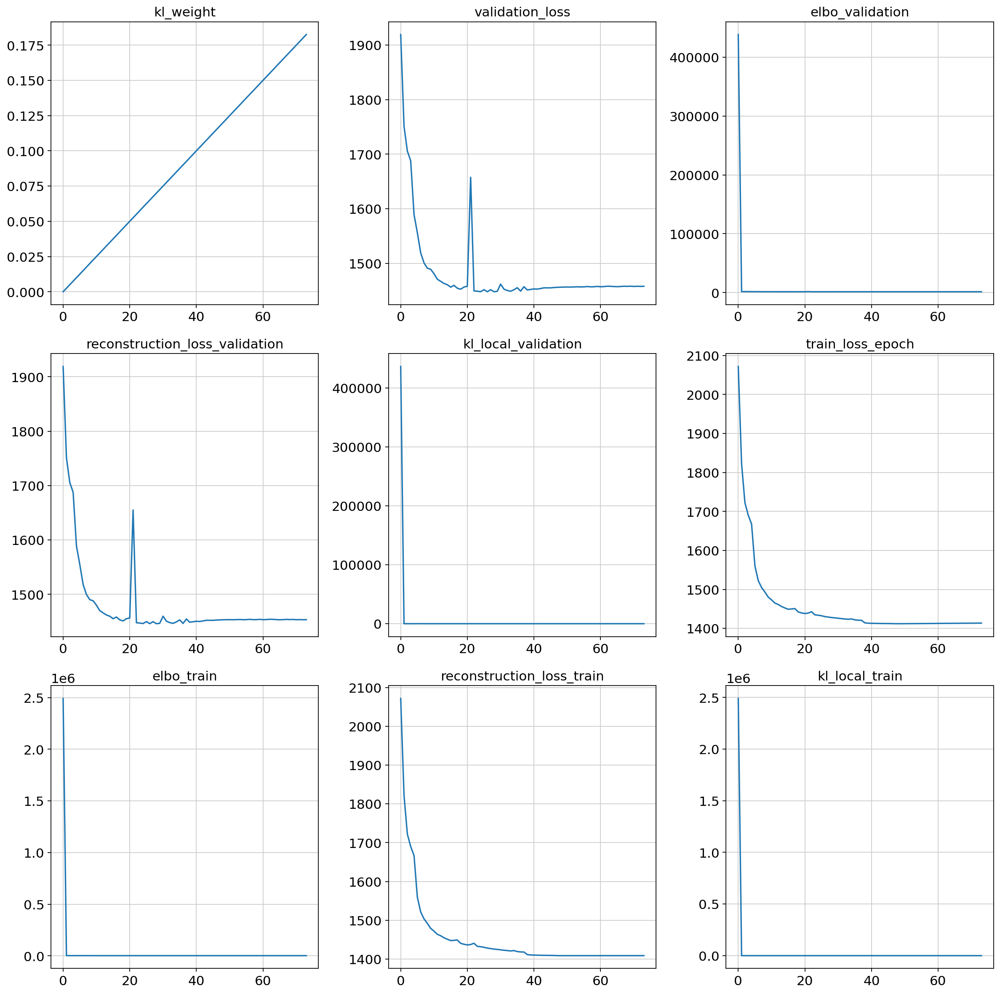

In [13]:
history_keys = [
    'kl_weight', 'validation_loss', 'elbo_validation', 
    'reconstruction_loss_validation', 'kl_local_validation', 
    'train_loss_epoch', 'elbo_train', 'reconstruction_loss_train', 
    'kl_local_train'
]

# Assuming scanvae.history contains the training history
plot_training_history(vae.history, history_keys)

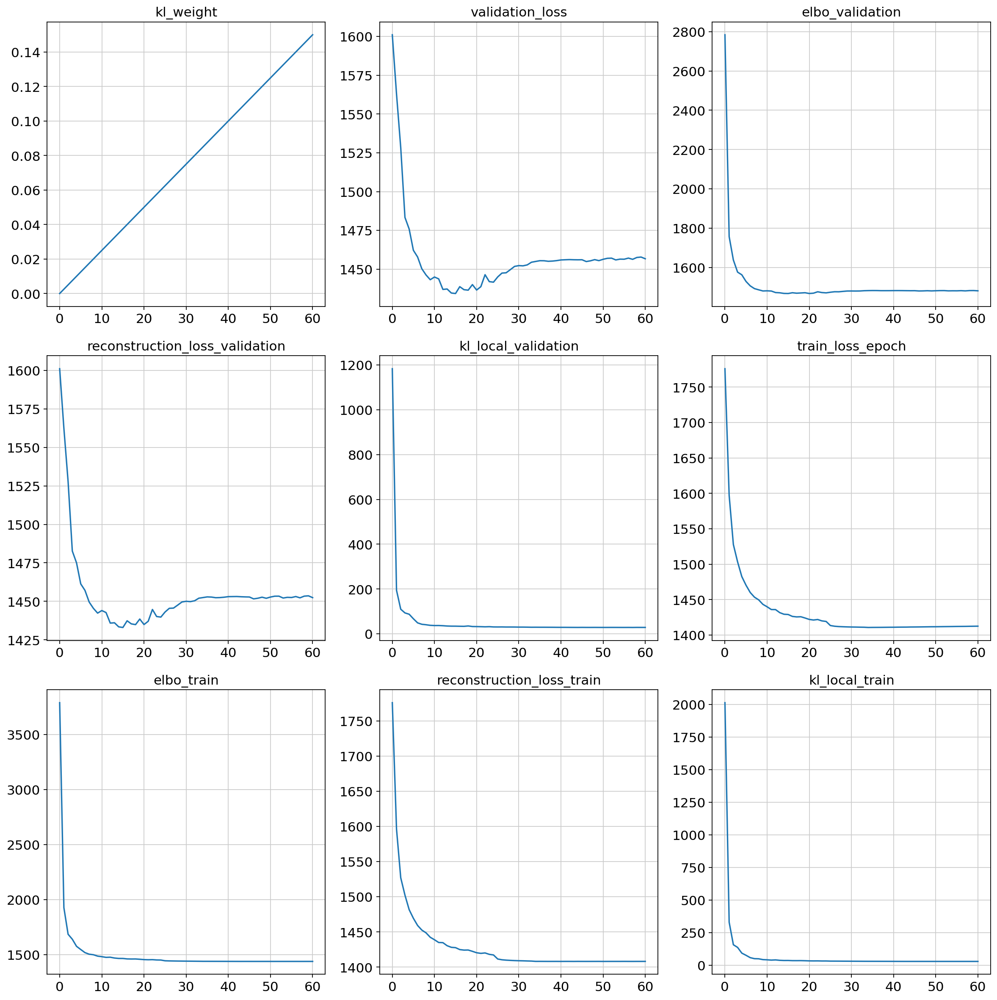

In [13]:
history_keys = [
    'kl_weight', 'validation_loss', 'elbo_validation', 
    'reconstruction_loss_validation', 'kl_local_validation', 
    'train_loss_epoch', 'elbo_train', 'reconstruction_loss_train', 
    'kl_local_train'
]

# Assuming scanvae.history contains the training history
plot_training_history(vae.history, history_keys)

#### SCANVI

In [14]:
scanvae = sca.models.SCANVI.from_scvi_model(vae, unlabeled_category = "Unknown")

In [ ]:
early_stopping_kwargs = {
    "early_stopping_monitor": "elbo",
    "early_stopping_patience": 10,
    "early_stopping_min_delta": 0.01,
}
# # This very importanto for actual covnergence... we have seen we tend to hit local minima and this helps i navoiding but only once...  a peridic approach would ve good
plan_kwargs= {
    # "weight_decay": 0.0,
    "reduce_lr_on_plateau": True,
    "lr_patience": 8,
    "lr_factor": 0.1,
}

scanvae.train(max_epochs=300, early_stopping=early_stopping_kwargs, plan_kwargs=plan_kwargs, batch_size=128)

INFO     Training for 300 epochs.                                                                                  


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 45/300:  15%|██████████████▏                                                                                  | 44/300 [4:58:53<29:46:10, 418.63s/it, v_num=1, train_loss_step=718, train_loss_epoch=1.41e+3]

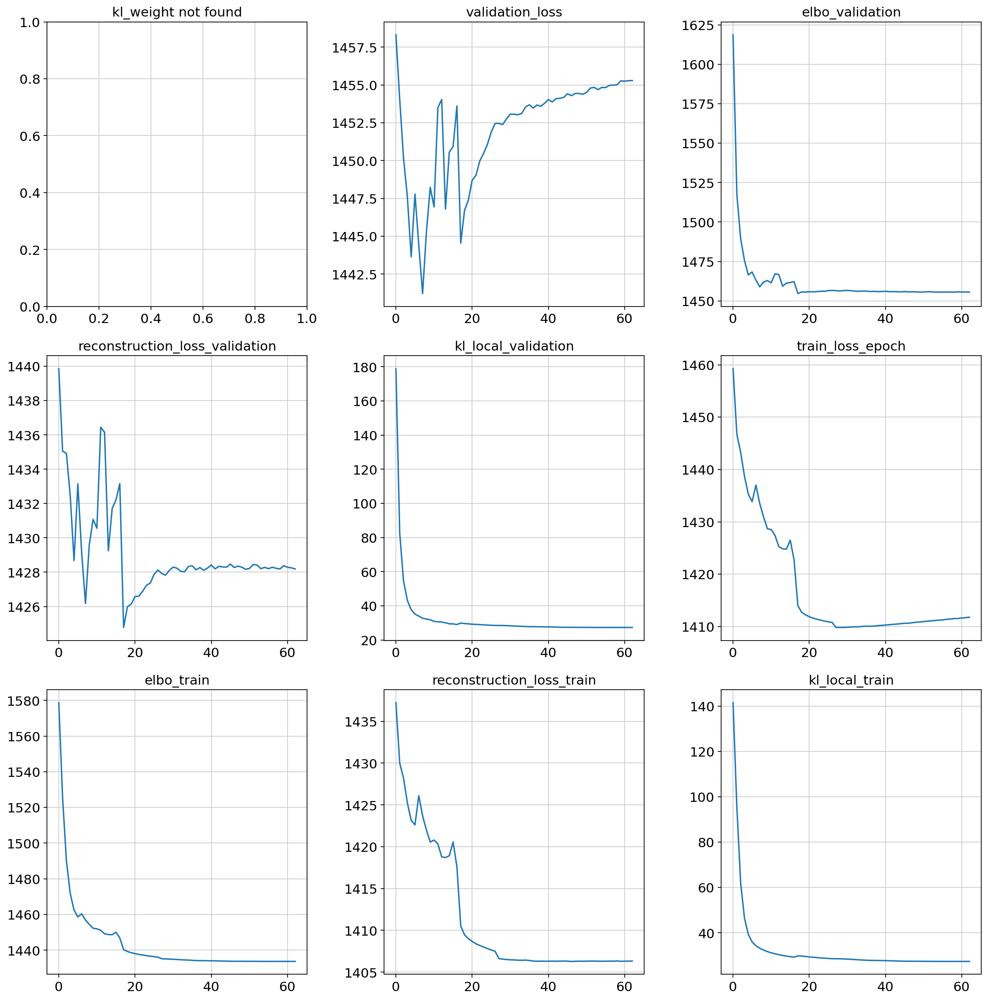

In [43]:
history_keys = [
    'kl_weight', 'validation_loss', 'elbo_validation', 
    'reconstruction_loss_validation', 'kl_local_validation', 
    'train_loss_epoch', 'elbo_train', 'reconstruction_loss_train', 
    'kl_local_train'
]

# Assuming scanvae.history contains the training history
plot_training_history(scanvae.history, history_keys)

In [ ]:
reference_latent = sc.AnnData(scanvae.get_latent_representation())
reference_latent.obs["cell_type"] = source_adata.obs[cell_type_key].tolist()
reference_latent.obs["batch"] = source_adata.obs[condition_key].tolist()

In [44]:
reference_latent.obs['predictions'] = scanvae.predict()
print("Acc: {}".format(np.mean(reference_latent.obs.predictions == reference_latent.obs.cell_type)))

Acc: 0.9886398068717496


In [41]:
ref_path = '/root/datos/maestria/netopaas/lung_scRNA/LUCA_model/hvg_integrated_scvi_scanvi_tumor_model_b128_lay4_h1024_raydefault/'
scanvae.save(ref_path, overwrite=True)
# scanvae = sca.models.SCANVI.load(ref_path, source_adata)

INFO     File                                                                                                      
         /root/datos/maestria/netopaas/lung_scRNA/LUCA_model/hvg_integrated_scvi_scanvi_tumor_model_b128_lay4_h1024
         _raydefault/model.pt already downloaded                                                                   


/usr/local/lib/python3.11/site-packages/scvi/model/base/_save_load.py:71: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path, map_location=map_locat

#### SCANVI 2nd run

In [ ]:
scanvae.train(max_epochs=300, early_stopping=early_stopping_kwargs, plan_kwargs=plan_kwargs, batch_size=128)

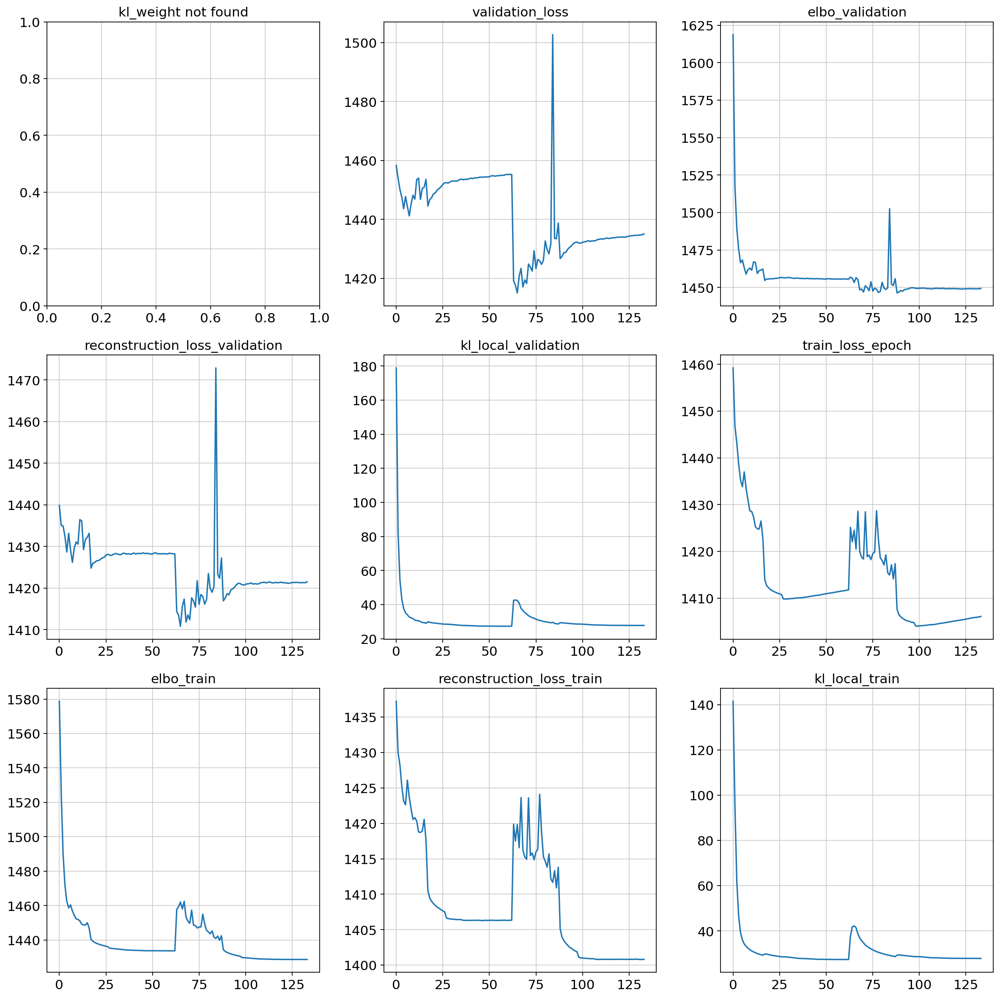

In [45]:
history_keys = [
    'kl_weight', 'validation_loss', 'elbo_validation', 
    'reconstruction_loss_validation', 'kl_local_validation', 
    'train_loss_epoch', 'elbo_train', 'reconstruction_loss_train', 
    'kl_local_train'
]

# Assuming scanvae.history contains the training history
plot_training_history(scanvae.history, history_keys)

In [ ]:
reference_latent = sc.AnnData(scanvae.get_latent_representation())
reference_latent.obs["cell_type"] = source_adata.obs[cell_type_key].tolist()
reference_latent.obs["batch"] = source_adata.obs[condition_key].tolist()

In [35]:
# reference_latent.obs['predictions'] = scanvae.predict()
print("Acc: {}".format(np.mean(reference_latent.obs.predictions == reference_latent.obs.cell_type)))

Acc: 0.9957455157785979


**WuhuuuuuuuuuuuU!**

In [55]:
ref_path = '/root/datos/maestria/netopaas/lung_scRNA/LUCA_model/hvg_integrated_scvi_scanvi_tumor_model_b128_lay4_h1024_raydefault_epocs300-300/'
scanvae.save(ref_path, overwrite=True)

In [37]:
# reference_latent.write_h5ad('/root/datos/maestria/netopaas/lung_scRNA/LUCA_model/hvg_integrated_scvi_scanvi_tumor_model_b128_lay4_h1024_raydefault_epocs300-300/ref_latent.h5ad')
reference_latent = sc.read_h5ad('/root/datos/maestria/netopaas/lung_scRNA/LUCA_model/hvg_integrated_scvi_scanvi_tumor_model_b128_lay4_h1024_raydefault_epocs300-300/ref_latent.h5ad')

### b128_lay6_h1024

In [17]:
# elbo_trai is btter for converging and elbo is better for generalization.
# I would suggest, elbo_train for scVi and elbo for scANVI
early_stopping_kwargs = {
    "early_stopping_monitor": "elbo",
    "early_stopping_patience": 10,
    "early_stopping_min_delta": 0.01,
}
# This very importanto for actual covnergence... we have seen we tend to hit local minima and this helps i navoiding but only once...  a peridic approach would ve good
plan_kwargs= {
# "weight_decay": 0.0,
    # "reduce_lr_on_plateau": True,
    # "lr_patience": 8,
    # "lr_factor": 0.1,
}


vae = sca.models.SCVI(
    source_adata,
    n_layers=6,
    n_latent=20,
    n_hidden=1024,
    encode_covariates=True,
    deeply_inject_covariates=False,
    gene_likelihood='nb',  # Nb maybe may have less false postiives, because zinb zeros are complete technical zeroes which are not very realistic
    use_layer_norm="both",
    use_batch_norm="none",
)

In [18]:
# this levaes with litlle epochs and that does not achieve good accuracy
# max_epochs_scvi = np.min([round((20000 / source_adata.n_obs) * 400), 400])
vae.train(max_epochs=400, early_stopping=early_stopping_kwargs, plan_kwargs=plan_kwargs, batch_size=128)

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 400/400: 100%|███████████████████████████████████████████████████████████████████████████████████████████████| 400/400 [7:42:37<00:00, 67.61s/it, v_num=1, train_loss_step=1.13e+3, train_loss_epoch=1.65e+3]

INFO: `Trainer.fit` stopped: `max_epochs=400` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|███████████████████████████████████████████████████████████████████████████████████████████████| 400/400 [7:42:37<00:00, 69.39s/it, v_num=1, train_loss_step=1.13e+3, train_loss_epoch=1.65e+3]


In [19]:
ref_path = '/root/datos/maestria/netopaas/lung_scRNA/LUCA_model/hvg_integrated_scvi_tumor_model_b128_lay6_h1024/'
vae.save(ref_path, overwrite=True)

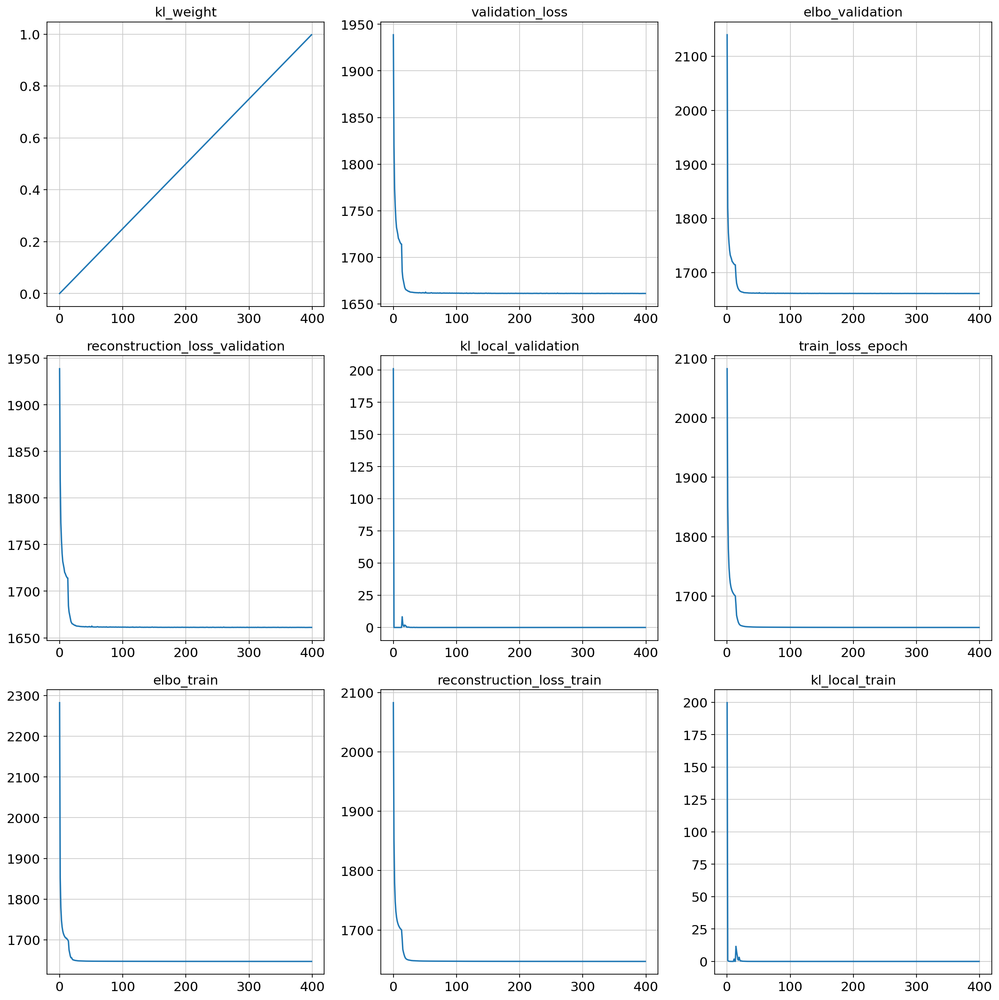

In [20]:
# 128bsize, 400 max, stop 85, 3 layers, 512 hidden
history_keys = [
    'kl_weight', 'validation_loss', 'elbo_validation', 
    'reconstruction_loss_validation', 'kl_local_validation', 
    'train_loss_epoch', 'elbo_train', 'reconstruction_loss_train', 
    'kl_local_train'
]

# Assuming scanvae.history contains the training history
plot_training_history(vae.history, history_keys)

### b128_lay3_h512

In [16]:
# elbo_trai is btter for converging and elbo is better for generalization.
# I would suggest, elbo_train for scVi and elbo for scANVI
early_stopping_kwargs = {
    "early_stopping_monitor": "elbo",
    "early_stopping_patience": 10,
    "early_stopping_min_delta": 0.01,
}
# This very importanto for actual covnergence... we have seen we tend to hit local minima and this helps i navoiding but only once...  a peridic approach would ve good
plan_kwargs= {"weight_decay": 0.0,
    # "reduce_lr_on_plateau": True,
    # "lr_patience": 8,
    # "lr_factor": 0.1,
}


vae = sca.models.SCVI(
    source_adata,
    n_layers=3,
    n_latent=20,
    n_hidden=512,
    encode_covariates=True,
    deeply_inject_covariates=False,
    gene_likelihood='nb',  # Nb maybe may have less false postiives, because zinb zeros are complete technical zeroes which are not very realistic
    use_layer_norm="both",
    use_batch_norm="none",
)

In [17]:
# this levaes with litlle epochs and that does not achieve good accuracy
# max_epochs_scvi = np.min([round((20000 / source_adata.n_obs) * 400), 400])
vae.train(max_epochs=400, early_stopping=early_stopping_kwargs, plan_kwargs=plan_kwargs, batch_size=128)

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 81/400:  20%|███████████████████▏                                                                           | 81/400 [1:06:07<4:20:26, 48.99s/it, v_num=1, train_loss_step=1.47e+3, train_loss_epoch=1.41e+3]
Monitored metric elbo_validation did not improve in the last 45 records. Best score: 1483.175. Signaling Trainer to stop.


In [18]:
ref_path = '/root/datos/maestria/netopaas/lung_scRNA/LUCA_model/hvg_integrated_scvi_tumor_model_b128_lay3_h512/'
vae.save(ref_path, overwrite=True)

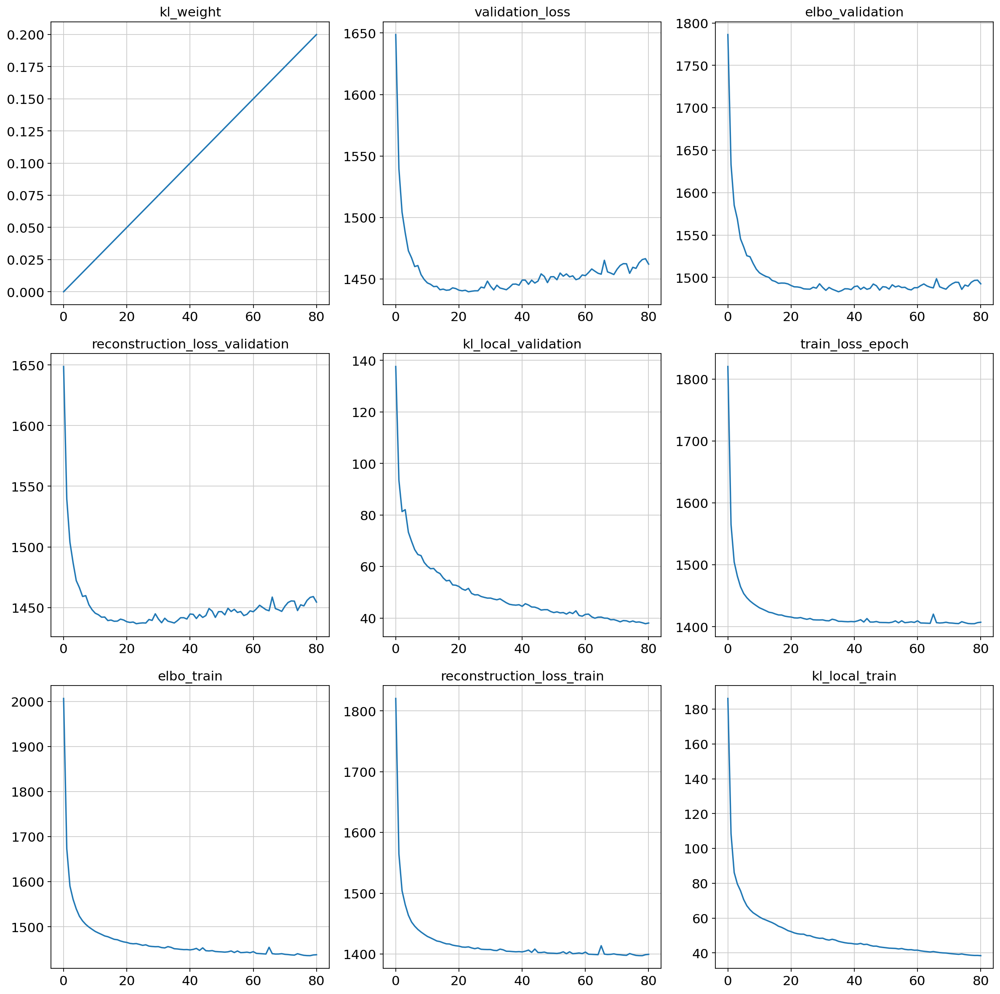

In [28]:
# 128bsize, 400 max, stop 85, 3 layers, 512 hidden
history_keys = [
    'kl_weight', 'validation_loss', 'elbo_validation', 
    'reconstruction_loss_validation', 'kl_local_validation', 
    'train_loss_epoch', 'elbo_train', 'reconstruction_loss_train', 
    'kl_local_train'
]

# Assuming scanvae.history contains the training history
plot_training_history(vae.history, history_keys)

In [21]:
scanvae = sca.models.SCANVI.from_scvi_model(vae, unlabeled_category = "Unknown")

In [22]:
early_stopping_kwargs = {
    "early_stopping_monitor": "elbo",
    "early_stopping_patience": 10,
    "early_stopping_min_delta": 0.01,
}
# # This very importanto for actual covnergence... we have seen we tend to hit local minima and this helps i navoiding but only once...  a peridic approach would ve good
plan_kwargs= {
    # "weight_decay": 0.0,
#     "reduce_lr_on_plateau": True,
#     "lr_patience": 8,
#     "lr_factor": 0.1,
}


scanvae.train(max_epochs=300, early_stopping=early_stopping_kwargs, plan_kwargs=plan_kwargs, batch_size=128)

INFO     Training for 300 epochs.                                                                                  


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 53/300:  18%|████████████████▊                                                                              | 53/300 [8:53:09<41:24:43, 603.58s/it, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.8e+3]
Monitored metric elbo_validation did not improve in the last 45 records. Best score: 1657.337. Signaling Trainer to stop.


In [23]:
reference_latent = sc.AnnData(scanvae.get_latent_representation())
reference_latent.obs["cell_type"] = source_adata.obs[cell_type_key].tolist()
reference_latent.obs["batch"] = source_adata.obs[condition_key].tolist()

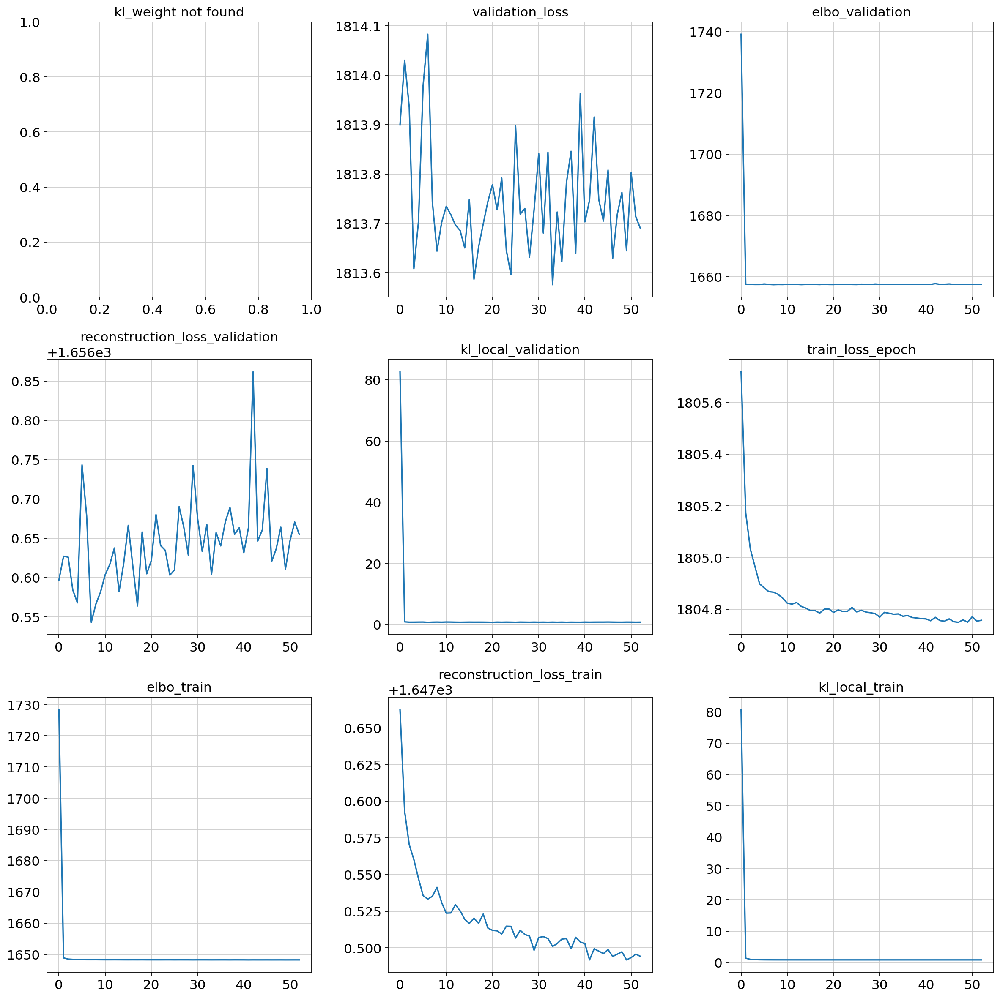

In [25]:
#vae 70 epoch, 128 bsize, hidden512, l 3; scanvae 80 epoch;  
history_keys = [
    'kl_weight', 'validation_loss', 'elbo_validation', 
    'reconstruction_loss_validation', 'kl_local_validation', 
    'train_loss_epoch', 'elbo_train', 'reconstruction_loss_train', 
    'kl_local_train'
]

# Assuming scanvae.history contains the training history
plot_training_history(scanvae.history, history_keys)

In [24]:

reference_latent.obs['predictions'] = scanvae.predict()
print("Acc: {}".format(np.mean(reference_latent.obs.predictions == reference_latent.obs.cell_type)))

Acc: 0.13966778761853196


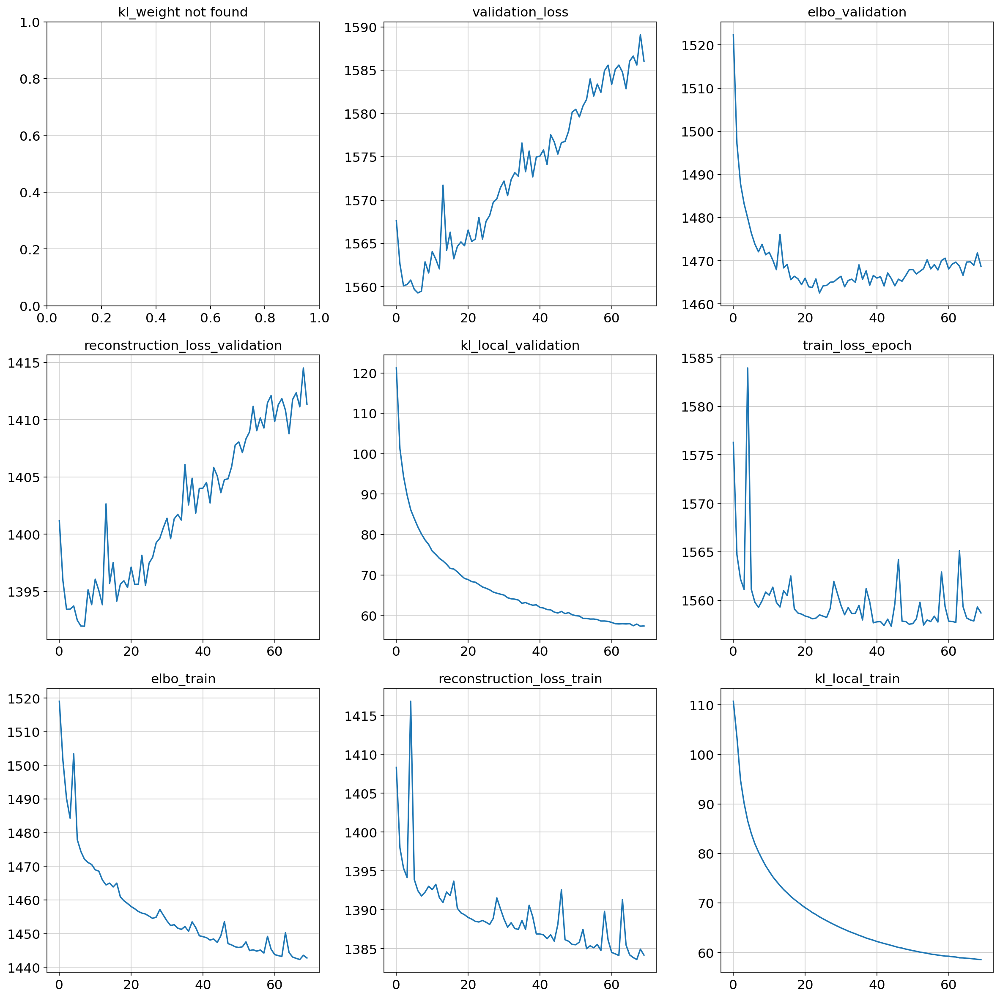

In [35]:
#vae 70 epoch, 128 bsize, hidden512, l 3; scanvae 80 epoch;  weight decay on
history_keys = [
    'kl_weight', 'validation_loss', 'elbo_validation', 
    'reconstruction_loss_validation', 'kl_local_validation', 
    'train_loss_epoch', 'elbo_train', 'reconstruction_loss_train', 
    'kl_local_train'
]

# Assuming scanvae.history contains the training history
plot_training_history(scanvae.history, history_keys)

In [38]:
#vae 70 epoch, 128 bsize, hidden512, l 3; scanvae 80 epoch;  
reference_latent.obs['predictions'] = scanvae.predict()
print("Acc: {}".format(np.mean(reference_latent.obs.predictions == reference_latent.obs.cell_type)))

Acc: 0.6790434985619694


In [68]:
ref_path = '/root/datos/maestria/netopaas/lung_scRNA/LUCA_model/hvg_integrated_scvi_scanvi_tumor_model_anvi4layers/'
scanvae.save(ref_path, overwrite=True)

### b1024_lay4_h512

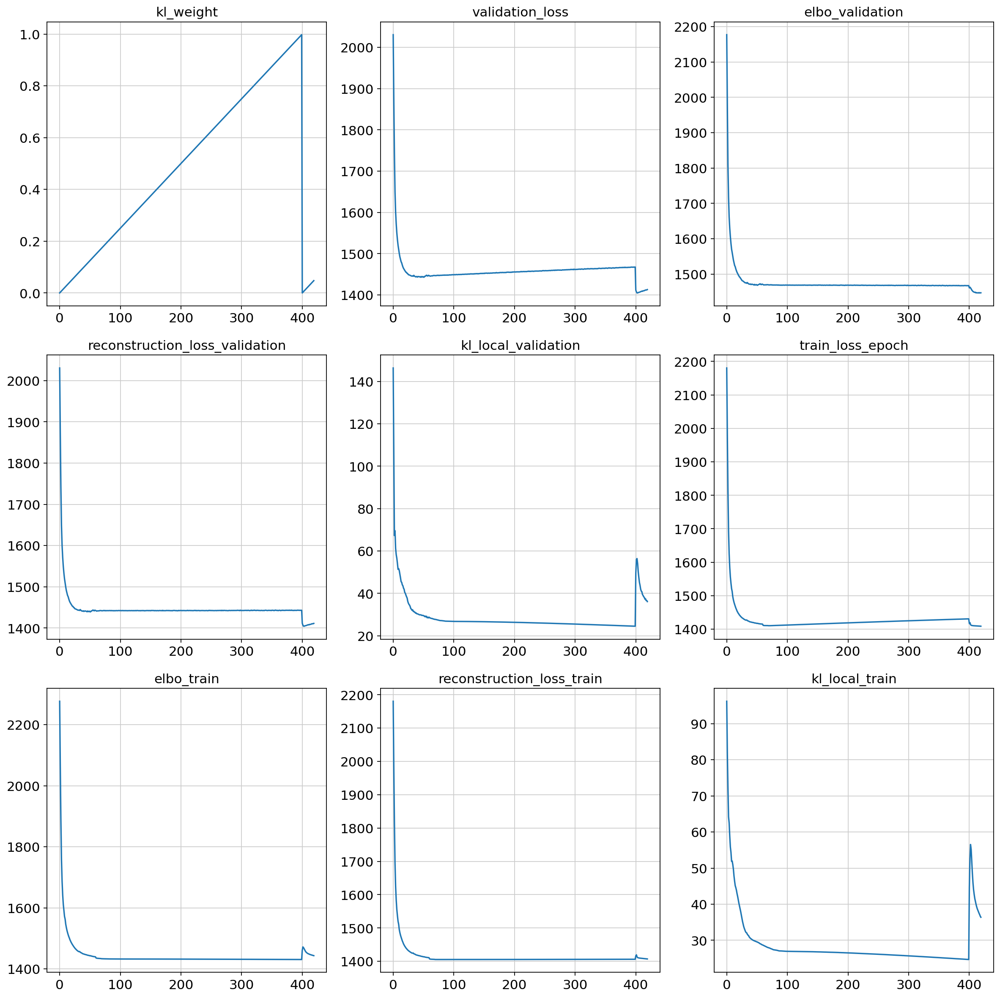

In [76]:
# hidden 512, batch 1024, layers 4, epoch 400 then 20
history_keys = [
    'kl_weight', 'validation_loss', 'elbo_validation', 
    'reconstruction_loss_validation', 'kl_local_validation', 
    'train_loss_epoch', 'elbo_train', 'reconstruction_loss_train', 
    'kl_local_train'
]

# Assuming scanvae.history contains the training history
plot_training_history(vae.history, history_keys)

In [21]:
scanvae = sca.models.SCANVI.from_scvi_model(vae, unlabeled_category = "Unknown")

In [ ]:
early_stopping_kwargs = {
    "early_stopping_monitor": "elbo",
    "early_stopping_patience": 10,
    "early_stopping_min_delta": 0.01,
}
# # This very importanto for actual covnergence... we have seen we tend to hit local minima and this helps i navoiding but only once...  a peridic approach would ve good
plan_kwargs= {
    # "weight_decay": 0.0,
#     "reduce_lr_on_plateau": True,
#     "lr_patience": 8,
#     "lr_factor": 0.1,
}


scanvae.train(max_epochs=300, early_stopping=early_stopping_kwargs, plan_kwargs=plan_kwargs, batch_size=128)

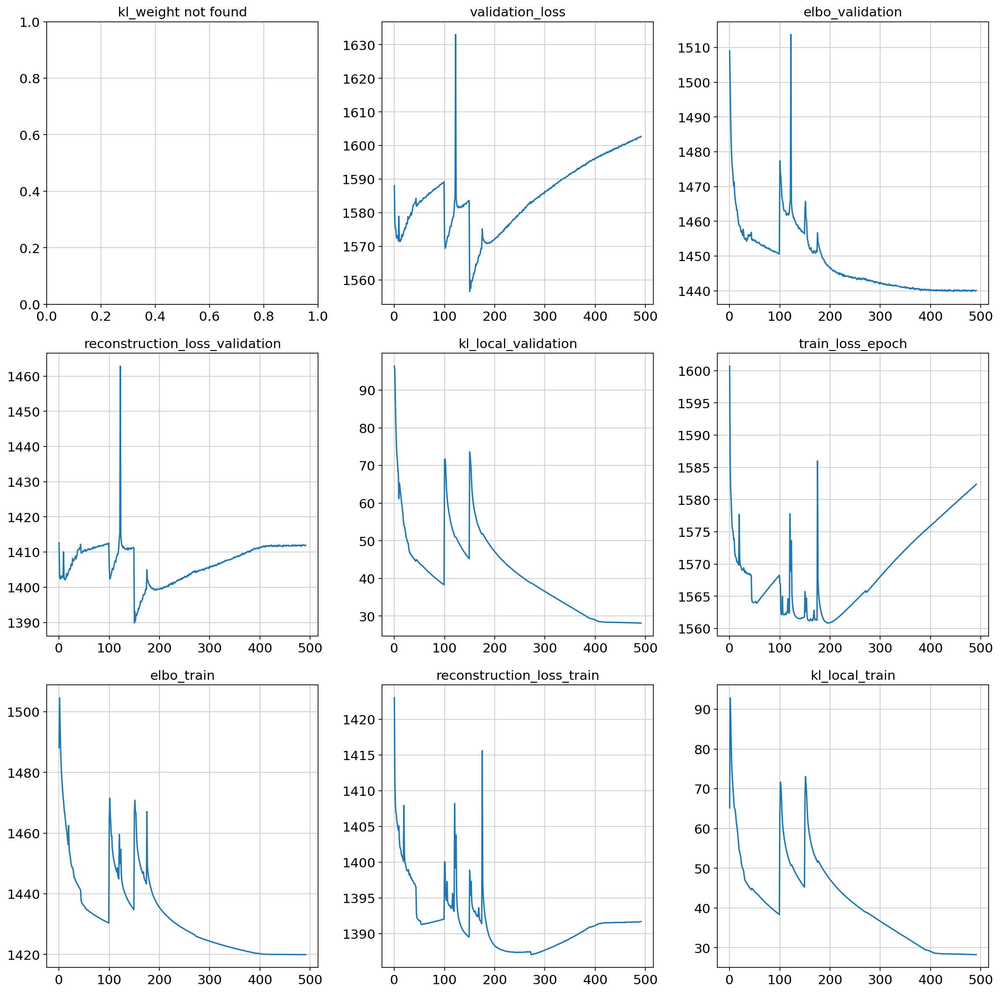

In [80]:
# 1 time vae 100 epoch, 512 bsize, 4 layers; 2 times scanvae 100-400
history_keys = [
    'kl_weight', 'validation_loss', 'elbo_validation', 
    'reconstruction_loss_validation', 'kl_local_validation', 
    'train_loss_epoch', 'elbo_train', 'reconstruction_loss_train', 
    'kl_local_train'
]

# Assuming scanvae.history contains the training history
plot_training_history(scanvae.history, history_keys)

## Create anndata file of latent representation and compute UMAP

In [37]:
reference_latent = sc.AnnData(scanvae.get_latent_representation())
reference_latent.obs["cell_type"] = source_adata.obs[cell_type_key].tolist()
reference_latent.obs["batch"] = source_adata.obs[condition_key].tolist()

In [27]:
reference_latent.write_h5ad(f'{ref_path}/hvg_embed.h5ad')

/usr/local/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


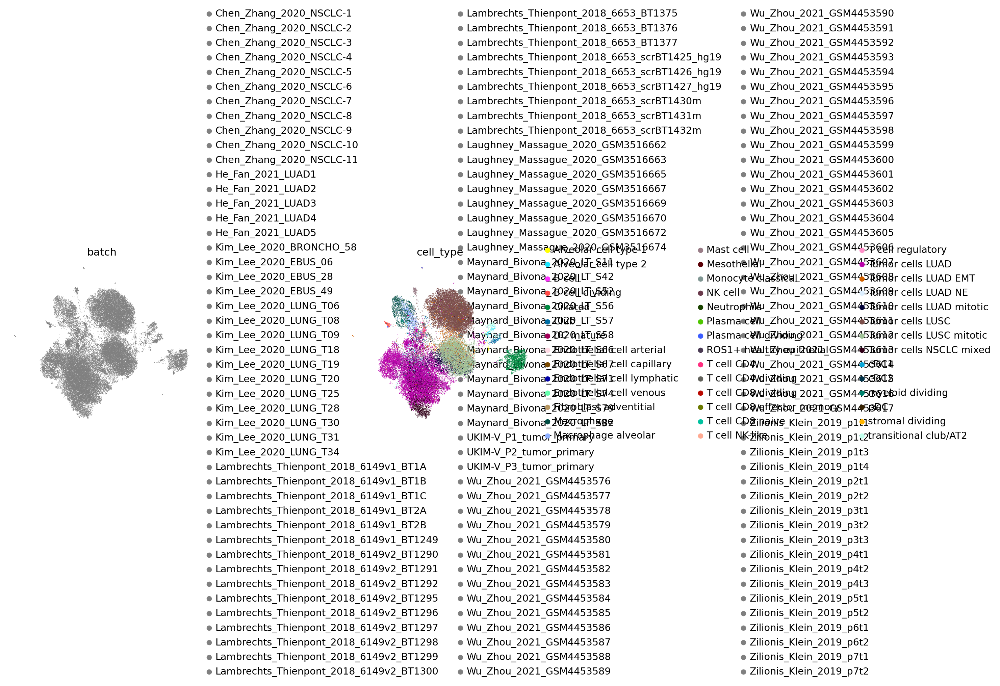

In [111]:
sc.pp.neighbors(reference_latent, n_neighbors=8)
sc.tl.leiden(reference_latent)
sc.tl.umap(reference_latent)
sc.pl.umap(reference_latent,
           color=['cell_type'],
           frameon=False,
           wspace=0.6,
           )

### Various past predictions with no performance graphs

In [12]:
#  2 times vae 3lyaers, batch 1024, size 250-100; 4 times scanvae 100-100-400-200nolradjust batch
reference_latent.obs['predictions'] = scanvae.predict()
print("Acc: {}".format(np.mean(reference_latent.obs.predictions == reference_latent.obs.cell_type)))

Acc: 0.711986568446778


In [66]:
#  2 times vae 3lyaers, batch 1024, size 250-100; 3 times scanvae 100-100-400 batch
reference_latent.obs['predictions'] = scanvae.predict()
print("Acc: {}".format(np.mean(reference_latent.obs.predictions == reference_latent.obs.cell_type)))

Acc: 0.7120660450930621


In [61]:
#  2 times vae 3lyaers, batch 1024, size 250-100; 2 times scanvae 100 batch
reference_latent.obs['predictions'] = scanvae.predict()
print("Acc: {}".format(np.mean(reference_latent.obs.predictions == reference_latent.obs.cell_type)))

Acc: 0.708181624005921


In [53]:
#  2 times vae 3 layers, batch 1024, 1 times scanvae
# reference_latent.obs['predictions'] = scanvae.predict()
print("Acc: {}".format(np.mean(reference_latent.obs.predictions == reference_latent.obs.cell_type)))

Acc: 0.704168053368568


In [189]:
# 1 time vae 400 epoch, 128 bsize, 3 layers, no lr adjust; 3 times scanvae 300 epoch
# But on dataset of only tumor cells 67k instead of 4m
reference_latent.obs['predictions'] = scanvae2.predict()
print("Acc: {}".format(np.mean(reference_latent.obs.predictions == reference_latent.obs.cell_type)))

Acc: 0.904988161515326


### Recover past trainings with no adata

In [45]:
from scvi.model.base._utils import _load_saved_files
attr_dict, var_names, model_state_dict, adata_ = _load_saved_files(
    '/root/datos/maestria/netopaas/lung_scRNA/LUCA_model/hvg_integrated_scvi_scanvi_tumor_model_layers4/',
    load_adata=False, map_location='cpu')
attr_dict

INFO     File                                                                                                      
         /root/datos/maestria/netopaas/lung_scRNA/LUCA_model/hvg_integrated_scvi_scanvi_tumor_model_layers4/model.p
         t already downloaded                                                                                      


{'history_': {'train_loss_step':       train_loss_step
  epoch                
  0         1618.816284
  1         1551.252686,
  'validation_loss':       validation_loss
  epoch                
  0         1579.084106,
  'elbo_validation':       elbo_validation
  epoch                
  0         1500.672363,
  'reconstruction_loss_validation':       reconstruction_loss_validation
  epoch                               
  0                        1403.753418,
  'kl_local_validation':       kl_local_validation
  epoch                    
  0               96.919006,
  'kl_global_validation':       kl_global_validation
  epoch                     
  0                      0.0,
  'validation_classification_loss':       validation_classification_loss
  epoch                               
  0                           3.506613,
  'validation_accuracy':       validation_accuracy
  epoch                    
  0                0.458287,
  'validation_f1_score':       validation_f1_score
  epo

## Perform surgery on reference model and train on query dataset without cell type labels

In [ ]:
backup_dir = '/root/datos/maestria/netopaas/luca_explore/surgeries/'

### My filtered Zuani

#### Import

In [66]:
ref_path = '/root/datos/maestria/netopaas/lung_scRNA/LUCA_model/hvg_integrated_scvi_scanvi_tumor_model_3layers/'
surgery_path = f'{backup_dir}/Zuani_99acc'

In [ ]:
target_adata = sc.read_h5ad('/root/datos/maestria/netopaas/luca_explore/surgeries/filtered_Zuani_2024_NSCLC.h5ad')
# target_adata.obs[cell_type_key] = scanvae.unlabeled_category_
target_adata.obs[cell_type_key] = 'Unknown'

In [45]:
target_adata.obs.index = 'Zuani_' + target_adata.obs.barcode.astype('string')
target_adata.obs_names_make_unique()

In [46]:
zuani_ensembl = pd.read_csv('/root/datos/maestria/netopaas/zuani_ensembl.csv', index_col=0)
zuani_ensembl

,symbol,ensembl_gene_id
MIR1302-2HG,MIR1302-2HG,ENSG00000243485
AL627309.1,AL627309.1,ENSG00000237683
AL627309.3,AL627309.3,NaN
AL627309.4,AL627309.4,NaN
AL732372.1,AL732372.1,ENSG00000256186
...,...,...
AC004556.1,AC004556.1,NaN
AC233755.2,AC233755.2,NaN
AC233755.1,AC233755.1,NaN
AC240274.1,AC240274.1,NaN


In [47]:
target_adata.var['symbol'] = target_adata.var.index
target_adata.var['ensembl_gene_id'] = zuani_ensembl.ensembl_gene_id
target_adata.var.index = target_adata.var['ensembl_gene_id']
target_adata.var

,n_counts,mito,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,symbol,ensembl_gene_id
ensembl_gene_id,,,,,,,,
ENSG00000243485,6.0,False,3,0.000011,99.998872,3.0,MIR1302-2HG,ENSG00000243485
ENSG00000237683,354.0,False,295,0.001117,99.889082,297.0,AL627309.1,ENSG00000237683
NaN,55.0,False,50,0.000188,99.981200,50.0,AL627309.3,NaN
NaN,66.0,False,57,0.000214,99.978568,57.0,AL627309.4,NaN
ENSG00000256186,191.0,False,104,0.000406,99.960897,108.0,AL732372.1,ENSG00000256186
...,...,...,...,...,...,...,...,...
NaN,16627.0,False,11995,0.053654,95.489974,14270.0,AC004556.1,NaN
NaN,2683.0,False,286,0.009979,99.892466,2654.0,AC233755.2,NaN
NaN,1195.0,False,349,0.004294,99.868779,1142.0,AC233755.1,NaN


In [48]:
target_adata = target_adata[:, ~target_adata.var.index.duplicated(keep='first')].copy() # create a copy to avoid modifying the original object
target_adata.var.index = pd.Index(target_adata.var.index) # convert to a plain Index object, which enforces uniqueness

In [49]:
adata_query = sca.models.SCANVI.prepare_query_anndata(
    adata = target_adata,
    # return_reference_var_names=True,
    reference_model = ref_path,
    inplace=False)

INFO     File                                                                                                      
         /root/datos/maestria/netopaas/lung_scRNA/LUCA_model/hvg_integrated_scvi_scanvi_tumor_model_3layers/model.p
         t already downloaded                                                                                      


/usr/local/lib/python3.11/site-packages/scvi/model/base/_utils.py:66: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path, map_location=map_location)

INFO     Found 93.30439138420438% reference vars in query data.                                                    


Some fixes to be able to serialize

In [71]:
adata_query.obs.index.name = 'index'
adata_query.obs.index = adata_query.obs.index.astype("O")

In [72]:
adata_query.write_h5ad(f'{surgery_path}/query.h5ad')

#### Train

In [ ]:
adata_query = sc.read_h5ad(f'{surgery_path}/query.h5ad')

In [43]:
adata_query

AnnData object with n_obs × n_vars = 250242 × 5989
    obs: 'n_genes', 'patient', 'sample', 'environment', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'sex', 'age', 'sorting', 'smoking history', 'cancer stage', 'tumour type', '# isolated cells', '# estimated cells', 'sangerID', 'cellranger', 'genome', 'batch', 'patient_sample', 'exp', 'n_counts', 'doublet_scores', 'S_score', 'G2M_score', 'phase', 'PHASE', 'leiden', 'leiden_new_cmcells_v4', 'leiden_new_bcells_v4', 'leiden_new_mastcells_v3', 'leiden_new_myeloid_v6', 'leiden_new_nkcells_v2', 'leiden_new_stroma_v8', 'leiden_new_tcells_v4', 'leiden_new_broad_v1', 'Cell types', 'Cell types v2', 'Cell types v3', 'Cell types v4', 'Cell types v5', 'Cell types v6', 'Cell types v7', 'Cell types v8', 'Cell types v9', 'Cell types v10', 'Cell types v11', 'Cell types v12', 'Cell types v13', 'Cell types v14', 'Cell types v15', 'Cell types v16', 'Cell types v17', 'Cell types v18', 'Cell t

In [17]:
adata_query.obs['dataset'] = 'Zuani'
# scvi.settings.batch_size = 1024

model = sca.models.SCANVI.load_query_data(
    adata_query,
    ref_path,
    freeze_dropout = True,
)
model._unlabeled_indices = np.arange(adata_query.n_obs)
model._labeled_indices = []
print("Labelled Indices: ", len(model._labeled_indices))
print("Unlabelled Indices: ", len(model._unlabeled_indices))

INFO     File                                                                                                      
         /root/datos/maestria/netopaas/lung_scRNA/LUCA_model/hvg_integrated_scvi_scanvi_tumor_model_3layers/model.p
         t already downloaded                                                                                      


/usr/local/lib/python3.11/site-packages/scvi/model/base/_save_load.py:71: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path, map_location=map_locat

Labelled Indices:  0
Unlabelled Indices:  220866


In [65]:
early_stopping_kwargs = {
    "early_stopping_monitor": "elbo",
    "early_stopping_patience": 10,
    "early_stopping_min_delta": 0.001,
}
# # This very importanto for actual covnergence... we have seen we tend to hit local minima and this helps i navoiding but only once...  a peridic approach would ve good
plan_kwargs= {
    # "weight_decay": 0.0,
    "reduce_lr_on_plateau": True,
    "lr_patience": 8,
    "lr_factor": 0.1,
}
# scvi.settings.num_workers = 40

model.train(
    max_epochs=200,
    check_val_every_n_epoch=10,
    batch_size=128,
    early_stopping=early_stopping_kwargs, 
    plan_kwargs=plan_kwargs
)

INFO     Training for 200 epochs.                                                                                  


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 200/200: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [9:07:48<00:00, 164.34s/it, v_num=1, train_loss_step=1.48e+3, train_loss_epoch=1.53e+3]

INFO: `Trainer.fit` stopped: `max_epochs=200` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=200` reached.


Epoch 200/200: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [9:07:48<00:00, 164.34s/it, v_num=1, train_loss_step=1.48e+3, train_loss_epoch=1.53e+3]


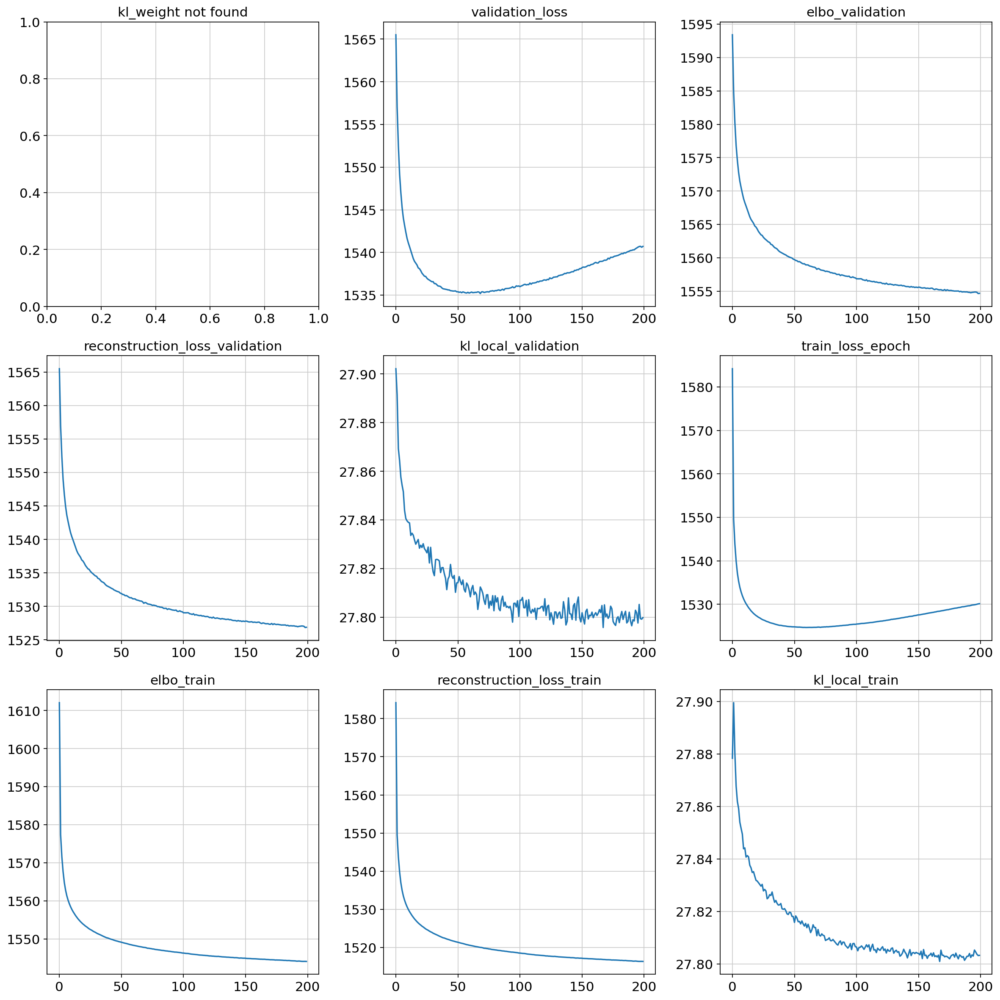

In [73]:
history_keys = [
    'kl_weight', 'validation_loss', 'elbo_validation', 
    'reconstruction_loss_validation', 'kl_local_validation', 
    'train_loss_epoch', 'elbo_train', 'reconstruction_loss_train', 
    'kl_local_train'
]

# Assuming scanvae.history contains the training history
plot_training_history(model.history, history_keys)

In [53]:
# model.save(surgery_dir, overwrite=True)
model = sca.models.SCANVI.load(surgery_dir, adata_query)

INFO     File /root/datos/maestria/netopaas/luca_explore/surgeries//Zuani_99acc/model.pt already downloaded        


/usr/local/lib/python3.11/site-packages/scvi/model/base/_utils.py:66: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path, map_location=map_location)

In [54]:
# query_latent.write_h5ad(f'{backup_dir}/Zuani_99acc/query_latent.h5ad')
query_latent = sc.read_h5ad(f'{surgery_path}/query_latent.h5ad')

### Their annotated Zuani

#### Import

In [6]:
ref_path = '/root/datos/maestria/netopaas/lung_scRNA/LUCA_model/hvg_integrated_scvi_scanvi_tumor_model_3layers/'
surgery_path = f'{backup_dir}/Zuani_99acc_annoted'

In [5]:
target_adata = sc.read_h5ad('/root/datos/maestria/netopaas/Zuani2024/10X_Lung_Tumour_Annotated_v2.h5ad')
target_adata = adata_zuani[adata_zuani.obs.sorting == 'CD235a-']

target_adata.obs[cell_type_key] = scanvae.unlabeled_category_
target_adata.obs[cell_type_key] = 'Unknown'

In [38]:
target_adata.obs.index = 'Zuani_' + target_adata.obs.index.astype('string')
target_adata.obs_names_make_unique()

In [39]:
zuani_ensembl = pd.read_csv('/root/datos/maestria/netopaas/zuani_ensembl.csv', index_col=0)
zuani_ensembl

,symbol,ensembl_gene_id
MIR1302-2HG,MIR1302-2HG,ENSG00000243485
AL627309.1,AL627309.1,ENSG00000237683
AL627309.3,AL627309.3,NaN
AL627309.4,AL627309.4,NaN
AL732372.1,AL732372.1,ENSG00000256186
...,...,...
AC004556.1,AC004556.1,NaN
AC233755.2,AC233755.2,NaN
AC233755.1,AC233755.1,NaN
AC240274.1,AC240274.1,NaN


In [40]:
target_adata.var['symbol'] = target_adata.var.index
target_adata.var['ensembl_gene_id'] = zuani_ensembl.ensembl_gene_id
target_adata.var.index = target_adata.var['ensembl_gene_id']
target_adata.var

,feature_types,n_cells,mean,std,highly_variable,means,dispersions,dispersions_norm,highly_variable_nbatches,highly_variable_intersection,symbol,ensembl_gene_id
ensembl_gene_id,,,,,,,,,,,,
ENSG00000121410,Gene Expression,194060,0.230991,0.513031,False,0.400959,1.265465,-0.220756,2,False,A1BG,ENSG00000121410
ENSG00000268895,Gene Expression,24606,0.024549,0.174821,False,0.049930,1.096563,-0.165551,3,False,A1BG-AS1,ENSG00000268895
ENSG00000148584,Gene Expression,87,0.000133,0.011056,False,0.000465,0.017421,-0.019022,0,False,A1CF,ENSG00000148584
ENSG00000175899,Gene Expression,109320,0.172797,0.494571,True,0.275572,1.900700,1.569519,31,False,A2M,ENSG00000175899
ENSG00000245105,Gene Expression,26260,0.021960,0.182004,True,0.077691,1.562706,0.855970,27,False,A2M-AS1,ENSG00000245105
...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000070476,Gene Expression,65296,0.061078,0.273516,False,0.128474,1.255525,0.093375,2,False,ZXDC,ENSG00000070476
ENSG00000203995,Gene Expression,1230,0.001776,0.046937,False,0.002403,0.553230,-0.151484,0,False,ZYG11A,ENSG00000203995
ENSG00000162378,Gene Expression,109383,0.089389,0.323101,False,0.166225,1.250283,0.033981,4,False,ZYG11B,ENSG00000162378


In [41]:
target_adata = target_adata[:, ~target_adata.var.index.duplicated(keep='first')].copy() # create a copy to avoid modifying the original object
target_adata.var.index = pd.Index(target_adata.var.index) # convert to a plain Index object, which enforces uniqueness

In [42]:
adata_query = sca.models.SCANVI.prepare_query_anndata(
    adata = target_adata,
    # return_reference_var_names=True,
    reference_model = ref_path,
    inplace=False)

INFO     File                                                                                                      
         /root/datos/maestria/netopaas/lung_scRNA/LUCA_model/hvg_integrated_scvi_scanvi_tumor_model_3layers/model.p
         t already downloaded                                                                                      
INFO     Found 93.17081315745533% reference vars in query data.                                                    


/usr/local/lib/python3.11/site-packages/scvi/model/base/_save_load.py:71: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path, map_location=map_locat

In [87]:
adata_query.write(f'{surgery_path}/query.h5ad')

#### Train

In [ ]:
adata_query = sc.read_h5ad(f'{surgery_path}/query.h5ad')

In [43]:
adata_query

AnnData object with n_obs × n_vars = 250242 × 5989
    obs: 'n_genes', 'patient', 'sample', 'environment', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'sex', 'age', 'sorting', 'smoking history', 'cancer stage', 'tumour type', '# isolated cells', '# estimated cells', 'sangerID', 'cellranger', 'genome', 'batch', 'patient_sample', 'exp', 'n_counts', 'doublet_scores', 'S_score', 'G2M_score', 'phase', 'PHASE', 'leiden', 'leiden_new_cmcells_v4', 'leiden_new_bcells_v4', 'leiden_new_mastcells_v3', 'leiden_new_myeloid_v6', 'leiden_new_nkcells_v2', 'leiden_new_stroma_v8', 'leiden_new_tcells_v4', 'leiden_new_broad_v1', 'Cell types', 'Cell types v2', 'Cell types v3', 'Cell types v4', 'Cell types v5', 'Cell types v6', 'Cell types v7', 'Cell types v8', 'Cell types v9', 'Cell types v10', 'Cell types v11', 'Cell types v12', 'Cell types v13', 'Cell types v14', 'Cell types v15', 'Cell types v16', 'Cell types v17', 'Cell types v18', 'Cell t

In [9]:
adata_query.obs['dataset'] = 'Zuani'
# scvi.settings.batch_size = 1024

model = sca.models.SCANVI.load_query_data(
    adata_query,
    ref_path,
    freeze_dropout = True,
)
model._unlabeled_indices = np.arange(adata_query.n_obs)
model._labeled_indices = []
print("Labelled Indices: ", len(model._labeled_indices))
print("Unlabelled Indices: ", len(model._unlabeled_indices))

NameError: name 'adata_query' is not defined

In [ ]:
early_stopping_kwargs = {
    "early_stopping_monitor": "elbo",
    "early_stopping_patience": 10,
    "early_stopping_min_delta": 0.01,
}
# # This very importanto for actual covnergence... we have seen we tend to hit local minima and this helps i navoiding but only once...  a peridic approach would ve good
plan_kwargs= {
    # "weight_decay": 0.0,
    "reduce_lr_on_plateau": True,
    "lr_patience": 8,
    "lr_factor": 0.1,
}
# scvi.settings.num_workers = 40

model.train(
    max_epochs=100,
    check_val_every_n_epoch=10,
    batch_size=128,
    early_stopping=early_stopping_kwargs, 
    plan_kwargs=plan_kwargs
)

INFO     Training for 100 epochs.                                                                                  


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck.

Epoch 13/100:  12%|███████████▋                                                                                     | 12/100 [13:02<1:37:27, 66.45s/it, v_num=1, train_loss_step=1.63e+3, train_loss_epoch=1.61e+3]

In [ ]:
history_keys = [
    'kl_weight', 'validation_loss', 'elbo_validation', 
    'reconstruction_loss_validation', 'kl_local_validation', 
    'train_loss_epoch', 'elbo_train', 'reconstruction_loss_train', 
    'kl_local_train'
]

# Assuming scanvae.history contains the training history
plot_training_history(model.history, history_keys)

In [12]:
model.save(f'{backup_dir}/Zuani_99acc_annoted', overwrite=True)

INFO     File /root/datos/maestria/netopaas/luca_explore/surgeries//Zuani_99acc_annoted/model.pt already downloaded


/usr/local/lib/python3.11/site-packages/scvi/model/base/_utils.py:66: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path, map_location=map_location)

In [13]:

# query_latent.write_h5ad(f'{backup_dir}/Zuani_99acc_annoted/query_latent.h5ad')

## Get predictions

In [6]:
condition_key = 'dataset'
cell_type_key = 'cell_type_tumor'

In [7]:
backup_dir = '/root/datos/maestria/netopaas/luca_explore/surgeries/'

### Their annotated Zuani

In [ ]:
ref_path = '/root/datos/maestria/netopaas/lung_scRNA/LUCA_model/hvg_integrated_scvi_scanvi_tumor_model_3layers/'
surgery_path = f'{backup_dir}/Zuani_99acc_annoted'

In [75]:
adata_query = sc.read_h5ad(f'{surgery_path}/query.h5ad')
model = sca.models.SCANVI.load(surgery_path, adata_query)
query_latent = sc.AnnData(model.get_latent_representation())
print(adata_query)
model

AnnData object with n_obs × n_vars = 250242 × 5989
    obs: 'n_genes', 'patient', 'sample', 'environment', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'sex', 'age', 'sorting', 'smoking history', 'cancer stage', 'tumour type', '# isolated cells', '# estimated cells', 'sangerID', 'cellranger', 'genome', 'batch', 'patient_sample', 'exp', 'n_counts', 'doublet_scores', 'S_score', 'G2M_score', 'phase', 'PHASE', 'leiden', 'leiden_new_cmcells_v4', 'leiden_new_bcells_v4', 'leiden_new_mastcells_v3', 'leiden_new_myeloid_v6', 'leiden_new_nkcells_v2', 'leiden_new_stroma_v8', 'leiden_new_tcells_v4', 'leiden_new_broad_v1', 'Cell types', 'Cell types v2', 'Cell types v3', 'Cell types v4', 'Cell types v5', 'Cell types v6', 'Cell types v7', 'Cell types v8', 'Cell types v9', 'Cell types v10', 'Cell types v11', 'Cell types v12', 'Cell types v13', 'Cell types v14', 'Cell types v15', 'Cell types v16', 'Cell types v17', 'Cell types v18', 'Cell t

ScanVI Model with the following params: 
unlabeled_category: Unknown, n_hidden: 1024, n_latent: 10, n_layers: 4, dropout_rate: 0.1, dispersion: gene, 
gene_likelihood: nb
Training status: Trained
Model's adata is minified?: False

In [15]:
# query_latent = sc.AnnData(model.get_latent_representation())
query_latent.obs['cell_type'] = model.predict()
query_latent.obs['batch'] = adata_query.obs[condition_key].tolist()

query_latent.obs.index = adata_query.obs.index
query_latent.obs['source_type'] = adata_query.obs['Cell types']

<Figure size 320x320 with 0 Axes>

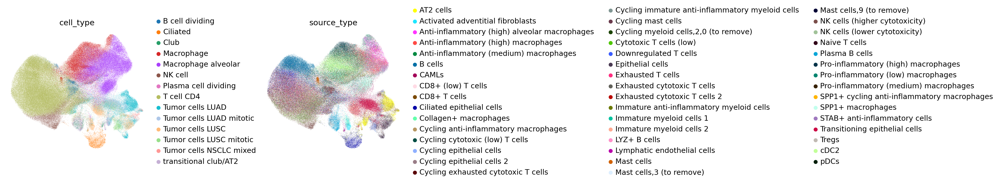

In [35]:
# Their annotated Zuani
# sc.pp.neighbors(query_latent)
# sc.tl.leiden(query_latent)
# sc.tl.umap(query_latent)
plt.figure()
sc.pl.umap(
    query_latent,
    color=["cell_type", 'source_type'],
    frameon=False,
    wspace=0.6,
)

In [39]:
adata_zuani

AnnData object with n_obs × n_vars = 250242 × 5989
    obs: 'n_genes', 'patient', 'sample', 'environment', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'sex', 'age', 'sorting', 'smoking history', 'cancer stage', 'tumour type', '# isolated cells', '# estimated cells', 'sangerID', 'cellranger', 'genome', 'batch', 'patient_sample', 'exp', 'n_counts', 'doublet_scores', 'S_score', 'G2M_score', 'phase', 'PHASE', 'leiden', 'leiden_new_cmcells_v4', 'leiden_new_bcells_v4', 'leiden_new_mastcells_v3', 'leiden_new_myeloid_v6', 'leiden_new_nkcells_v2', 'leiden_new_stroma_v8', 'leiden_new_tcells_v4', 'leiden_new_broad_v1', 'Cell types', 'Cell types v2', 'Cell types v3', 'Cell types v4', 'Cell types v5', 'Cell types v6', 'Cell types v7', 'Cell types v8', 'Cell types v9', 'Cell types v10', 'Cell types v11', 'Cell types v12', 'Cell types v13', 'Cell types v14', 'Cell types v15', 'Cell types v16', 'Cell types v17', 'Cell types v18', 'Cell t

Text(0, 0.5, 'Observed')

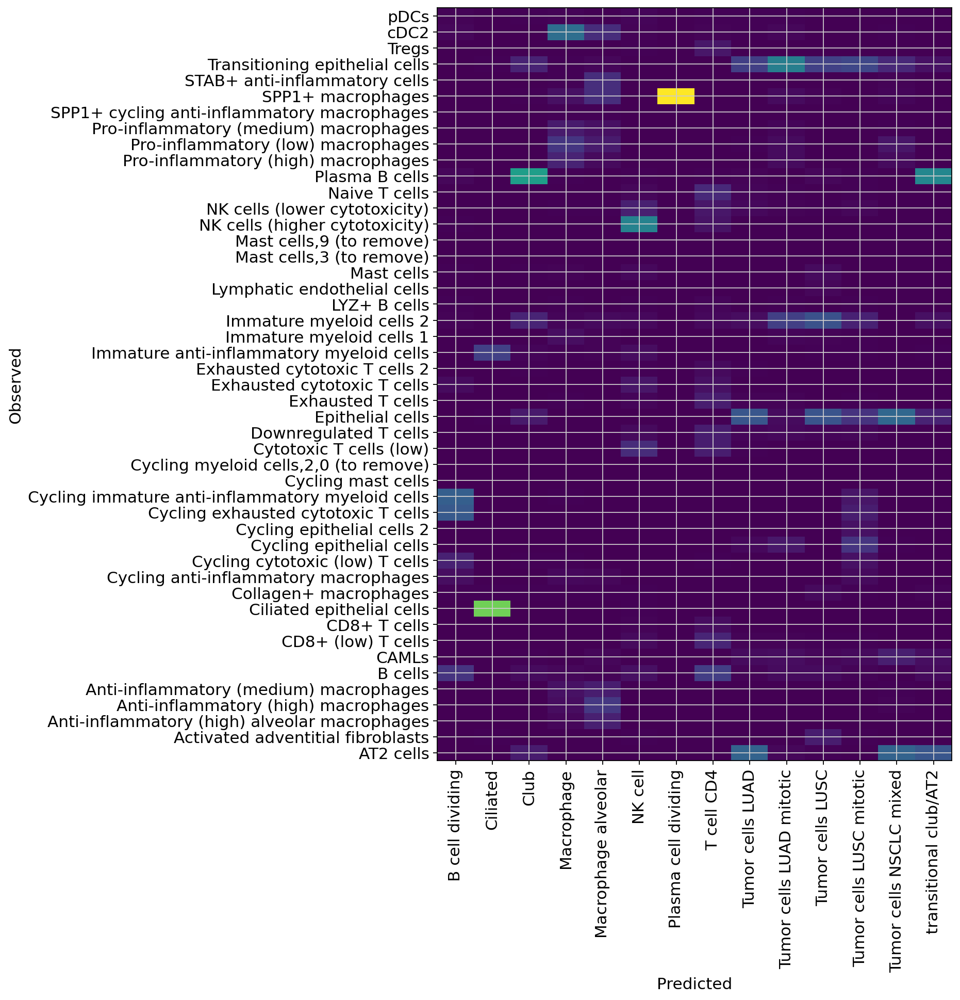

In [43]:
df = query_latent.obs.groupby(["source_type", "cell_type"]).size().unstack(fill_value=0)
norm_df = df / df.sum(axis=0)

plt.figure(figsize=(8, 12))
_ = plt.pcolor(norm_df)
_ = plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns, rotation=90)
_ = plt.yticks(np.arange(0.5, len(df.index), 1), df.index)
plt.xlabel("Predicted")
plt.ylabel("Observed")

Wow super bad prediction! Maybe it is because of overfitting? Or maybe it is because of their preprocessing and harmonization. 
Remeber we use the raw counts without harmonization.

### My filtered Zuani

In [8]:
ref_path = '/root/datos/maestria/netopaas/lung_scRNA/LUCA_model/hvg_integrated_scvi_scanvi_tumor_model_3layers/'
surgery_path = f'{backup_dir}/Zuani_99acc'

In [76]:
adata_query = sc.read_h5ad(f'{surgery_path}/query.h5ad')
# model = sca.models.SCANVI.load(surgery_path, adata_query)
# query_latent = sc.AnnData(model.get_latent_representation())
# print(adata_query)
# model

We will be comparing against their annotation so we will have to do ajoin in the barcodes. 
We must also import their annots

In [11]:
adata_zuani = sc.read(f'{backup_dir}/Zuani_99acc_annoted/query.h5ad')
annots_df = adata_zuani.obs.loc[:, 'Cell types']
annots_df

Zuani_AAACGAAAGTCACGCC-1-8-0                      Cycling cytotoxic (low) T cells
Zuani_AACCTGAGTTCAGGTT-1-8-0     Cycling immature anti-inflammatory myeloid cells
Zuani_AACGGGAAGTTCAACC-1-8-0     Cycling immature anti-inflammatory myeloid cells
Zuani_AAGAACAGTCGCGTCA-1-8-0     Cycling immature anti-inflammatory myeloid cells
Zuani_AAGACAAGTTCCTAGA-1-8-0     Cycling immature anti-inflammatory myeloid cells
                                                       ...                       
Zuani_TTAATCCAGCGTATAA-1-71-7                                                pDCs
Zuani_TTCAGGATCCAACTAG-1-71-7                                                pDCs
Zuani_TTCCGTGGTAGCCAGA-1-71-7                                                pDCs
Zuani_TTCCTAAAGATGGTAT-1-71-7                                                pDCs
Zuani_TTGCATTGTTCTCGTC-1-71-7                                                pDCs
Name: Cell types, Length: 250242, dtype: category
Categories (47, object): ['AT2 cells', 'Activate

In [104]:
import h5py
from anndata.experimental import read_elem

# Path to your .h5ad file
file_path = f'{backup_dir}/Zuani_99acc_annoted/query.h5ad'

# Open the .h5ad file using h5py
with h5py.File(file_path, 'r') as f:
    indices = read_elem(f["obs/_index"])
    cell_types = read_elem(f["obs/Cell types"])

annots_df = pd.DataFrame({
    'Cell types': cell_types
}, index=indices)

# Display the result
annots_df


,Cell types
Zuani_AAACGAAAGTCACGCC-1-8-0,Cycling cytotoxic (low) T cells
Zuani_AACCTGAGTTCAGGTT-1-8-0,Cycling immature anti-inflammatory myeloid cells
Zuani_AACGGGAAGTTCAACC-1-8-0,Cycling immature anti-inflammatory myeloid cells
Zuani_AAGAACAGTCGCGTCA-1-8-0,Cycling immature anti-inflammatory myeloid cells
Zuani_AAGACAAGTTCCTAGA-1-8-0,Cycling immature anti-inflammatory myeloid cells
...,...
Zuani_TTAATCCAGCGTATAA-1-71-7,pDCs
Zuani_TTCAGGATCCAACTAG-1-71-7,pDCs
Zuani_TTCCGTGGTAGCCAGA-1-71-7,pDCs
Zuani_TTCCTAAAGATGGTAT-1-71-7,pDCs


In [12]:
query_latent.obs['cell_type'] = model.predict()
query_latent.obs['batch'] = adata_query.obs[condition_key].tolist()
query_latent.obs.index = adata_query.obs.index

In [14]:
lol = adata_zuani.obs.groupby(['patient', 'cancer stage']).size().reset_index()
lol[lol[0]!=0]

,patient,cancer stage,0
0,Patient 4,NA,30248
14,Patient 8,T2b N1 M0,43177
27,Patient 15,T3N0M0,6341
35,Patient 16,T2bN0Mo,8110
43,Patient 17,T2aN0Mo,47528
52,Patient 18,T2a N1 M0,24382
66,Patient 19,T3M0No,18717
79,Patient 20,T4N2M0,2707
81,Patient 21,T1cN0Mo,3430
97,Patient 22,T3N0M0,1305


We remove patient 4 because we dont have it in the query as it doesnt have a tumor stage annotation

In [15]:
adata_zuani = adata_zuani[adata_zuani.obs.patient != 'Patient 4']

Now we have to make the ardous job of making the barcodes equivalent. 
For that we figure out which samples have the suffix 2 in our query and create a dict to assign to the barcodes in Zuani.

In [16]:
adata_zuani.obs['sample2'] = 'P' + adata_zuani.obs['patient'].str.split(' ').\
    map(lambda x: x[-1]) +  '_T' + adata_zuani.obs['sample'].str.split(' ').map(lambda x: x[-1])
adata_zuani.obs.sample2

/tmp/ipykernel_7699/2916956524.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_zuani.obs['sample2'] = 'P' + adata_zuani.obs['patient'].str.split(' ').map(lambda x: x[-1]) +  '_T' + adata_zuani.obs['sample'].str.split(' ').map(lambda x: x[-1])


Zuani_AAACCCAAGAGTGTTA-1-13-0     P8_T2
Zuani_AAACCCAAGTAGACCG-1-13-0     P8_T2
Zuani_AAACCCACAGTGAGCA-1-13-0     P8_T2
Zuani_AAACCCAGTGGACCAA-1-13-0     P8_T2
Zuani_AAACCCATCGATTGAC-1-13-0     P8_T2
                                  ...  
Zuani_TTAATCCAGCGTATAA-1-71-7    P24_T1
Zuani_TTCAGGATCCAACTAG-1-71-7    P24_T1
Zuani_TTCCGTGGTAGCCAGA-1-71-7    P24_T1
Zuani_TTCCTAAAGATGGTAT-1-71-7    P24_T1
Zuani_TTGCATTGTTCTCGTC-1-71-7    P24_T1
Name: sample2, Length: 219994, dtype: object

In [98]:
adata_zuani.obs.index = adata_zuani.obs.index.str.split('-').str[0] + '-' + adata_zuani.obs['sample2']

In [100]:
adata_zuani.obs.index.unique()

Index(['Zuani_AAACCCAAGAGTGTTA-P8_T2', 'Zuani_AAACCCAAGTAGACCG-P8_T2',
       'Zuani_AAACCCACAGTGAGCA-P8_T2', 'Zuani_AAACCCAGTGGACCAA-P8_T2',
       'Zuani_AAACCCATCGATTGAC-P8_T2', 'Zuani_AAACGAAAGCCAAGGT-P8_T2',
       'Zuani_AAACGAACAAGACCGA-P8_T2', 'Zuani_AAACGAACACACCTTC-P8_T2',
       'Zuani_AAACGAACAGCTGTTA-P8_T2', 'Zuani_AAACGAACATGGCTGC-P8_T2',
       ...
       'Zuani_TGGAGAGAGAGTGTTA-P24_T1', 'Zuani_TGGGATTAGATGCTGG-P24_T1',
       'Zuani_TGGTACAGTCCAGGTC-P24_T1', 'Zuani_TGTGCGGTCACCTGTC-P24_T1',
       'Zuani_TGTTTGTAGTTGAAGT-P24_T1', 'Zuani_TTAATCCAGCGTATAA-P24_T1',
       'Zuani_TTCAGGATCCAACTAG-P24_T1', 'Zuani_TTCCGTGGTAGCCAGA-P24_T1',
       'Zuani_TTCCTAAAGATGGTAT-P24_T1', 'Zuani_TTGCATTGTTCTCGTC-P24_T1'],
      dtype='object', length=219994)

In [101]:
adata_query.obs.index = adata_query.obs.index.str.split('-').str[0] + '-' + adata_query.obs['sample'].astype(str)

In [103]:
annots_df = adata_zuani.obs.loc[:, 'Cell types']
annots_df

Zuani_AAACCCAAGAGTGTTA-P8_T2                  Cycling exhausted cytotoxic T cells
Zuani_AAACCCAAGTAGACCG-P8_T2                      Cycling cytotoxic (low) T cells
Zuani_AAACCCACAGTGAGCA-P8_T2     Cycling immature anti-inflammatory myeloid cells
Zuani_AAACCCAGTGGACCAA-P8_T2                      Cycling cytotoxic (low) T cells
Zuani_AAACCCATCGATTGAC-P8_T2                  Cycling exhausted cytotoxic T cells
                                                       ...                       
Zuani_TTAATCCAGCGTATAA-P24_T1                                                pDCs
Zuani_TTCAGGATCCAACTAG-P24_T1                                                pDCs
Zuani_TTCCGTGGTAGCCAGA-P24_T1                                                pDCs
Zuani_TTCCTAAAGATGGTAT-P24_T1                                                pDCs
Zuani_TTGCATTGTTCTCGTC-P24_T1                                                pDCs
Name: Cell types, Length: 219994, dtype: category
Categories (47, object): ['AT2 cells', 'Activate

In [105]:
query_latent.obs.index = adata_query.obs.index
annots_joined = pd.DataFrame.join(query_latent.obs, annots_df, how='left')
annots_joined

,cell_type,batch,Cell types
Zuani_AAACCCAAGCAACTTC-P16_T2,T cell CD8 activated,Zuani,Exhausted cytotoxic T cells 2
Zuani_AAACCCAAGCGCTTCG-P16_T2,T cell CD8 activated,Zuani,NK cells (lower cytotoxicity)
Zuani_AAACCCAAGGCTAACG-P16_T2,T cell CD4,Zuani,CD8+ T cells
Zuani_AAACCCACATAGGTTC-P16_T2,T cell CD4,Zuani,Naive T cells
Zuani_AAACCCACATCCTTGC-P16_T2,T cell CD8 effector memory,Zuani,NK cells (lower cytotoxicity)
...,...,...,...
Zuani_TTTGATCAGTTGAATG-P20_T2,Plasma cell,Zuani,B cells
Zuani_TTTGATCGTCAGCTTA-P20_T2,Monocyte classical,Zuani,cDC2
Zuani_TTTGGAGGTCACCCTT-P20_T2,transitional club/AT2,Zuani,AT2 cells
Zuani_TTTGTTGAGTATGGAT-P20_T2,Tumor cells LUAD EMT,Zuani,Cycling epithelial cells


In [108]:
query_latent.obs = annots_joined

In [ ]:
query_latent.obs.rename(columns = {'Cell types': 'source_type'})

In [106]:
annots_joined['Cell types'].isna().sum()

881

In [ ]:
sc.pp.neighbors(query_latent)
sc.tl.leiden(query_latent)
sc.tl.umap(query_latent)
plt.figure()
sc.pl.umap(
    query_latent,
    color=["cell_type", 'source_type'],
    frameon=False,
    wspace=0.6,
)

Text(0, 0.5, 'Observed')

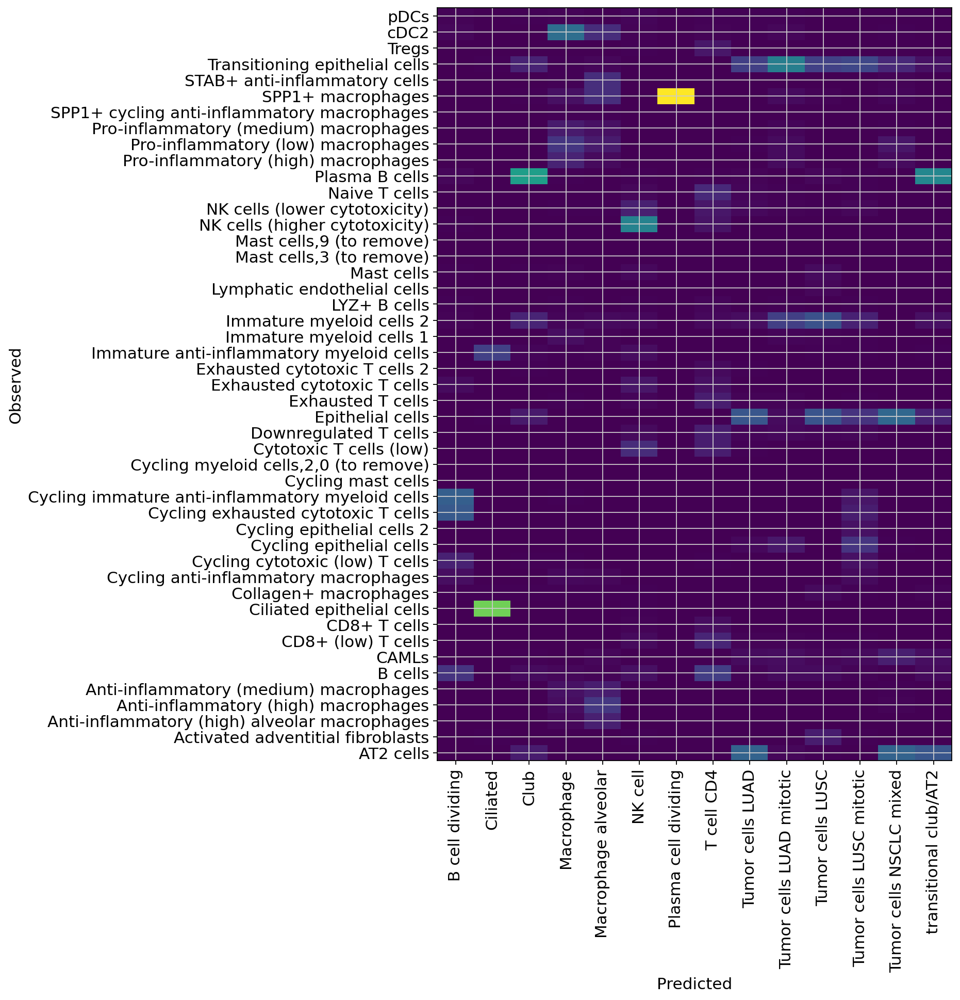

In [43]:
df = query_latent.obs.groupby(["source_type", "cell_type"]).size().unstack(fill_value=0)
norm_df = df / df.sum(axis=0)

plt.figure(figsize=(8, 12))
_ = plt.pcolor(norm_df)
_ = plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns, rotation=90)
_ = plt.yticks(np.arange(0.5, len(df.index), 1), df.index)
plt.xlabel("Predicted")
plt.ylabel("Observed")

Wow super bad prediction! Maybe it is because of overfitting? Or maybe it is because of their preprocessing and harmonization. 
Remeber we use the raw counts without harmonization.

## Compare with Original

We can see that the size of the clusters is somewhat similar. And for example the Mast  Cells are separated from the rest. We must remember that the local distance in UMAP is ot informative because fo the stochasticity of the data. Nevertheless, the global strcture is somehat informative and that is why separated clsuters have a generally different expression fingerprint. But to actually asses the quality of our reference model we will compare against the actual annotations from the article.

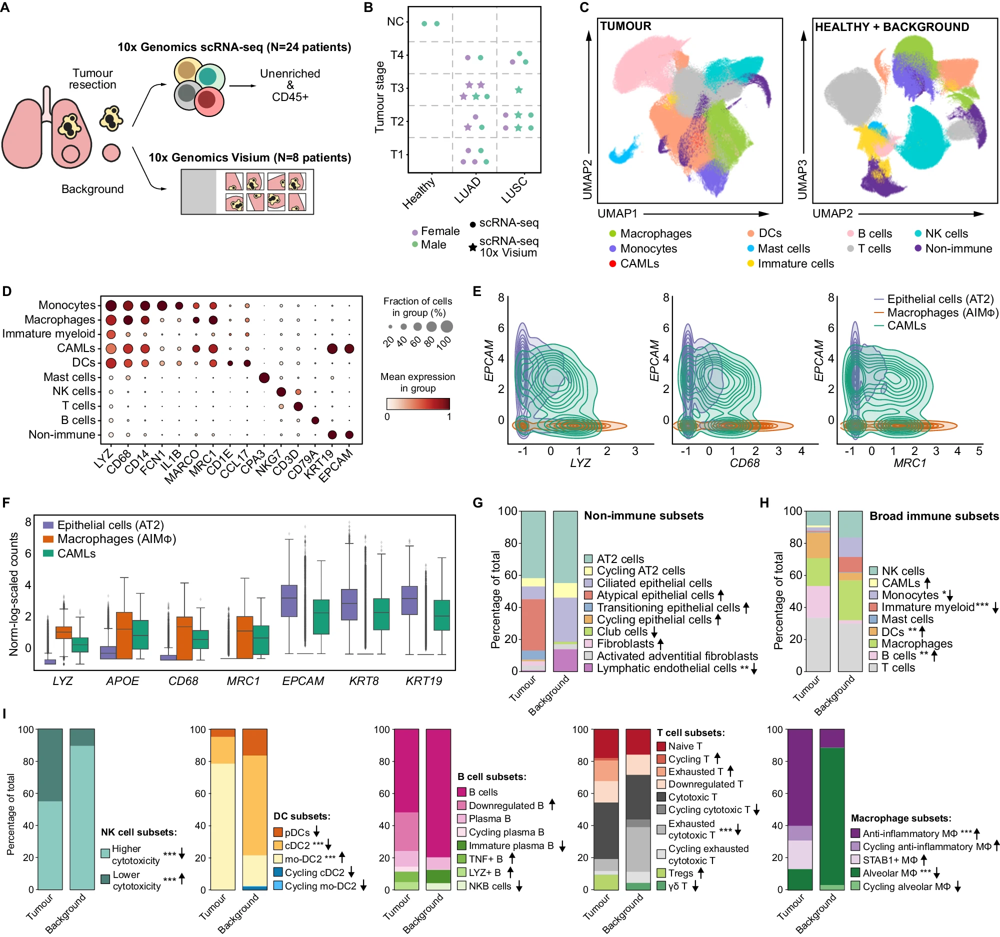

We must create an equivalence dict for these cell types and the ones we predict

In [29]:
list1 = list(adata_zuani.obs['Cell types'].unique())
list2 = query_latent.obs.predictions.unique()

for i in range(1,len(list2)):
    
    try:
        l1 = list1[i]
    except:
        l1 = "            "
        
    print(l1, '\t\t\t\t\t', list2[i])


Cycling immature anti-inflammatory myeloid cells 					 T cell CD4
Cycling exhausted cytotoxic T cells 					 T cell CD8 effector memory
Cycling anti-inflammatory macrophages 					 B cell
SPP1+ cycling anti-inflammatory macrophages 					 T cell CD8 terminally exhausted
Cycling myeloid cells,2,0 (to remove) 					 T cell CD8 naive
B cells 					 T cell regulatory
Immature myeloid cells 2 					 NK cell
Exhausted cytotoxic T cells 2 					 T cell NK-like
LYZ+ B cells 					 Neutrophils
Plasma B cells 					 T cell CD8 dividing
Mast cells 					 Macrophage
Mast cells,3 (to remove) 					 T cell CD4 dividing
Mast cells,9 (to remove) 					 Monocyte classical
Cycling mast cells 					 NK cell dividing
STAB+ anti-inflammatory cells 					 pDC
Anti-inflammatory (high) macrophages 					 Mast cell
Immature myeloid cells 1 					 cDC2
Pro-inflammatory (high) macrophages 					 Plasma cell
cDC2 					 Tumor cells LUAD
SPP1+ macrophages 					 Tumor cells LUSC
Anti-inflammatory (medium) macrophages 					 Macrophag

This prompt with chat gpt has given us this to start with:


    I have these cell types:
    ['Cycling cytotoxic (low) T cells',
     'Cycling immature anti-inflammatory myeloid cells',
     'Cycling exhausted cytotoxic T cells',
     'Cycling anti-inflammatory macrophages',
     'SPP1+ cycling anti-inflammatory macrophages',
     'Cycling myeloid cells,2,0 (to remove)',
     'B cells',
     'Immature myeloid cells 2',
     'Exhausted cytotoxic T cells 2',
     'LYZ+ B cells',
     'Plasma B cells',
     'Mast cells',
     'Mast cells,3 (to remove)',
     'Mast cells,9 (to remove)',
     'Cycling mast cells',
     'STAB+ anti-inflammatory cells',
     'Anti-inflammatory (high) macrophages',
     'Immature myeloid cells 1',
     'Pro-inflammatory (high) macrophages',
     'cDC2',
     'SPP1+ macrophages',
     'Anti-inflammatory (medium) macrophages',
     'Anti-inflammatory (high) alveolar macrophages',
     'Pro-inflammatory (low) macrophages',
     'Pro-inflammatory (medium) macrophages',
     'CAMLs',
     'NK cells (higher cytotoxicity)',
     'NK cells (lower cytotoxicity)',
     'Cytotoxic T cells (low)',
     'Exhausted cytotoxic T cells',
     'AT2 cells',
     'Ciliated epithelial cells',
     'Activated adventitial fibroblasts',
     'Lymphatic endothelial cells',
     'Immature anti-inflammatory myeloid cells',
     'Epithelial cells',
     'Transitioning epithelial cells',
     'Collagen+ macrophages',
     'Cycling epithelial cells',
     'Cycling epithelial cells 2',
     'CD8+ (low) T cells',
     'Downregulated T cells',
     'CD8+ T cells',
     'Naive T cells',
     'Tregs',
     'Exhausted T cells',
     'pDCs']
    
    I want to create a python dict, that assigns biologically relevant cell types fro mthe list above, to the list below:
    ['T cell CD8 activated', 'T cell CD4', 'T cell CD8 effector memory',
           'B cell', 'T cell CD8 terminally exhausted', 'T cell CD8 naive',
           'T cell regulatory', 'NK cell', 'T cell NK-like', 'Neutrophils',
           'T cell CD8 dividing', 'Macrophage', 'T cell CD4 dividing',
           'Monocyte classical', 'NK cell dividing', 'pDC', 'Mast cell',
           'cDC2', 'Plasma cell', 'Tumor cells LUAD', 'Tumor cells LUSC',
           'Macrophage alveolar', 'Monocyte non-classical',
           'Tumor cells LUSC mitotic', 'myeloid dividing',
           'Plasma cell dividing', 'Tumor cells NSCLC mixed', 'cDC1',
           'Ciliated', 'Fibroblast peribronchial', 'Tumor cells LUAD mitotic',
           'DC mature', 'B cell dividing', 'Club', 'transitional club/AT2',
           'Alveolar cell type 2', 'Endothelial cell arterial',
           'Endothelial cell lymphatic', 'Endothelial cell venous',
           'Fibroblast adventitial', 'Alveolar cell type 1',
           'Tumor cells LUAD NE', 'Tumor cells LUAD EMT', 'stromal dividing',
           'Pericyte', 'Smooth muscle cell', 'Fibroblast alveolar',
           'ROS1+ healthy epithelial', 'Mesothelial',
           'Endothelial cell capillary']
    
    Every key has as value an array that can have mutiple cell types.

important noting that :We did not detect neutrophilic granulocytes, most probably due to their sensitivity to degradation after collection and in particular to the freezing-thawing cycle. m

In [26]:
cell_type_mapping = {
    "Cycling cytotoxic (low) T cells": ["T cell CD8 activated", "T cell CD8 effector memory"],
    "Cycling immature anti-inflammatory myeloid cells": ["Macrophage", "Monocyte classical", "myeloid dividing"],
    "Cycling exhausted cytotoxic T cells": ["T cell CD8 terminally exhausted", "Fibroblast peribronchial"],
    "Cycling anti-inflammatory macrophages": ["Macrophage", "Mast cell"],
    "SPP1+ cycling anti-inflammatory macrophages": ["Macrophage alveolar", "Mast cell"],
    "Cycling myeloid cells,2,0 (to remove)": ["myeloid dividing"],
    "B cells": ["B cell", "Plasma cell"],
    "Immature myeloid cells 2": ["Monocyte classical", "NK cell"],
    "Exhausted cytotoxic T cells 2": ["T cell CD8 terminally exhausted", "T cell NK-like"],
    "LYZ+ B cells": ["Neutrophils"],
    "Plasma B cells": ["Plasma cell"],
    "Mast cells": ["Mast cell"],
    "Mast cells,3 (to remove)": ["Mast cell"],
    "Mast cells,9 (to remove)": ["Mast cell"],
    "Cycling mast cells": ["NK cell dividing", "Mast cell"],
    "STAB+ anti-inflammatory cells": ["pDC", "Macrophage alveolar"],
    "Anti-inflammatory (high) macrophages": ["Macrophage", "Mast cell"],
    "Immature myeloid cells 1": ["cDC2", "Monocyte classical"],
    "Pro-inflammatory (high) macrophages": ["Macrophage", "Plasma cell"],
    "cDC2": ["cDC2"],
    "SPP1+ macrophages": ["Macrophage alveolar", "Tumor cells LUSC"],
    "Anti-inflammatory (medium) macrophages": ["Macrophage alveolar"],
    "Anti-inflammatory (high) alveolar macrophages": ["Macrophage alveolar"],
    "Pro-inflammatory (low) macrophages": ["Macrophage"],
    "Pro-inflammatory (medium) macrophages": ["Macrophage"],
    "CAMLs": ["Plasma cell", "Plasma cell dividing"],
    "NK cells (higher cytotoxicity)": ["NK cell"],
    "NK cells (lower cytotoxicity)": ["NK cell", "cDC1"],
    "Cytotoxic T cells (low)": ["T cell CD8 activated"],
    "Exhausted cytotoxic T cells": ["T cell CD8 terminally exhausted", "Fibroblast peribronchial"],
    "AT2 cells": ["Alveolar cell type 2", "Tumor cells LUAD mitotic"],
    "Ciliated epithelial cells": ["Ciliated"],
    "Activated adventitial fibroblasts": ["Fibroblast adventitial", "B cell dividing"],
    "Lymphatic endothelial cells": ["Endothelial cell lymphatic"],
    "Immature anti-inflammatory myeloid cells": ["Macrophage", "transitional club/AT2"],
    "Epithelial cells": ["Alveolar cell type 2", "Endothelial cell capillary"],
    "Transitioning epithelial cells": ["Endothelial cell arterial"],
    "Collagen+ macrophages": ["Macrophage", "Endothelial cell lymphatic"],
    "Cycling epithelial cells": ["Endothelial cell venous"],
    "Cycling epithelial cells 2": ["Endothelial cell venous", "Fibroblast adventitial"],
    "CD8+ (low) T cells": ["T cell CD8 activated", "Alveolar cell type 1"],
    "Downregulated T cells": ["T cell CD8 terminally exhausted", "Tumor cells LUAD NE"],
    "CD8+ T cells": ["T cell CD8 activated", "Tumor cells LUAD EMT"],
    "Naive T cells": ["T cell CD8 naive", "stromal dividing"],
    "Tregs": ["T cell regulatory", "Pericyte"],
    "Exhausted T cells": ["T cell CD8 terminally exhausted", "Smooth muscle cell"],
    "pDCs": ["pDC", "Fibroblast alveolar"]
}


array(['T cell CD8 activated', 'T cell CD4', 'T cell CD8 effector memory',
       'B cell', 'T cell CD8 terminally exhausted', 'T cell CD8 naive',
       'T cell regulatory', 'NK cell', 'T cell NK-like', 'Neutrophils',
       'T cell CD8 dividing', 'Macrophage', 'T cell CD4 dividing',
       'Monocyte classical', 'NK cell dividing', 'pDC', 'Mast cell',
       'cDC2', 'Plasma cell', 'Tumor cells LUAD', 'Tumor cells LUSC',
       'Macrophage alveolar', 'Monocyte non-classical',
       'Tumor cells LUSC mitotic', 'myeloid dividing',
       'Plasma cell dividing', 'Tumor cells NSCLC mixed', 'cDC1',
       'Ciliated', 'Fibroblast peribronchial', 'Tumor cells LUAD mitotic',
       'DC mature', 'B cell dividing', 'Club', 'transitional club/AT2',
       'Alveolar cell type 2', 'Endothelial cell arterial',
       'Endothelial cell lymphatic', 'Endothelial cell venous',
       'Fibroblast adventitial', 'Alveolar cell type 1',
       'Tumor cells LUAD NE', 'Tumor cells LUAD EMT', 'stromal dividin

## Save predictions

In [78]:
adata_query.obs['cell_type_tumor'] = query_latent.obs['predictions']

In [79]:
adata_query.obs.to_csv('zuani_predicted.csv')

In [81]:
df = query_latent.obs.groupby(["cell_type", "predictions"]).size().unstack(fill_value=0)
# df
norm_df = df / df.sum(axis=0)
norm_df.filter(like='Tumor')

predictions,Tumor cells LUAD,Tumor cells LUAD EMT,Tumor cells LUAD NE,Tumor cells LUAD mitotic,Tumor cells LUSC,Tumor cells LUSC mitotic,Tumor cells NSCLC mixed
cell_type,,,,,,,
Alveolar cell type 1,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Alveolar cell type 2,0.0,0.0,0.0,0.0,0.0,0.0,0.0
B cell,0.0,0.0,0.0,0.0,0.0,0.0,0.0
B cell dividing,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Ciliated,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Club,0.0,0.0,0.0,0.0,0.0,0.0,0.0
DC mature,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Endothelial cell arterial,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Endothelial cell capillary,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [82]:
query_latent.obs['predictions'].value_counts()

Macrophage alveolar                28733
Macrophage                         25721
B cell                             25473
T cell CD4                         25201
Tumor cells LUAD                   22689
T cell CD8 effector memory         12307
Monocyte classical                 11025
T cell regulatory                  10685
cDC2                                7374
Plasma cell                         5610
NK cell                             5004
Tumor cells LUSC                    3911
T cell CD8 terminally exhausted     3411
Tumor cells LUAD mitotic            3398
T cell CD8 naive                    3322
Ciliated                            3072
transitional club/AT2               2920
T cell CD8 activated                2801
myeloid dividing                    2643
Tumor cells LUSC mitotic            2312
T cell NK-like                      1846
T cell CD4 dividing                 1750
Mast cell                           1124
B cell dividing                     1049
T cell CD8 divid

In [220]:
surgery_path = '/root/datos/maestria/netopaas/lung_scRNA/LUCA_model/Zuani'
model.save(surgery_path, overwrite=True)